In [ ]:
!pip install emoji


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:

import pandas as pd
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
from nltk.tokenize import NLTKWordTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
import re
import emoji
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from collections import Counter
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [4]:
# получим список стоп слов.
nltk_stop_words = set(stopwords.words("russian"))
#Lemmatizing the text
wnl = WordNetLemmatizer()

EMOTIONS = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'neutral']

# Функция для преобразования эмоджи в слова
def emojis_words(text):
    
    # Модуль emoji: преобразование эмоджи в их словесные описания
    clean_text = emoji.demojize(text, delimiters=(" ", " "))
    
    # Редактирование текста путём замены ":" и" _", а так же - путём добавления пробела между отдельными словами
    clean_text = clean_text.replace(":", "").replace("_", " ")
    
    return clean_text

# функция нормализации и очистки текста.
def cleaner(text :str) -> str:

    # Пунктуация
    text = re.sub(r'[.,#!$%\^&\*;:{}=\-_`~()]',r'',text)

     #Эмотиконы
    text =emojis_words(text)

    # #unicode
    # text = re.sub(r'(\\u[0-9A-Fa-f]+)',r'', text)
    # text = re.sub(r'[^\x00-\x7f]',r'',text)

    # url/ссылки
    text = re.sub(r'http\S+', r'', text)

    #теггирование/nicknames
    text = re.sub('@[A-Za-z0-9_-]+',r'',text)# nickname

    #хэштеги
    text = re.sub(r'#([^\s]+)', r'\1', text)

    #удалим цифры
    text = ''.join([i for i in text if not i.isdigit()])

    #приведем к нижнему регистру
    text = text.lower()

    #удалим стоп слова
    stop_words_cleaned = []
    for word in text.split():
      if word not in nltk_stop_words:
        stop_words_cleaned.append(word)

    text = ' '.join(stop_words_cleaned)

    #приведем текст к изначальной форме.
    text= ' '.join([wnl.lemmatize(word) for word in text.split()])

    return text

## ИМБП РАН

In [8]:
df = pd.read_csv('eskis.csv')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2591 entries, 0 to 2609
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   filename  2591 non-null   object 
 1   text      2591 non-null   object 
 2   anger     2591 non-null   float64
 3   disgust   2591 non-null   float64
 4   fear      2591 non-null   float64
 5   joy       2591 non-null   float64
 6   sadness   2591 non-null   float64
 7   surprise  2591 non-null   float64
 8   neutral   2591 non-null   float64
dtypes: float64(7), object(2)
memory usage: 202.4+ KB


In [10]:
df = df.dropna()

In [11]:
df = df.drop(labels="Unknown", axis=1)

In [12]:
rename_map = {
    'Angry': 'anger',
    'Disgusted': 'disgust',
    'Happy': 'joy',
    'Neutral': 'neutral',
    'Sad': 'sadness',
    'Scared': 'fear',
    'Surprised': 'surprise'
}
df = df.rename(columns=rename_map)

# Шаг 3. Выстраиваем столбцы в том же порядке, что и в df_big.
target_columns = ['filename','text', 'anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'neutral']
df = df[target_columns]

In [17]:
df.to_csv('eskis_trans.csv',index=False)

In [13]:
df.tail(50)

,filename,text,anger,disgust,fear,joy,sadness,surprise,neutral
2560,2021-04-30_00-28-10_seg_01.wav,здравствуйте уважаемая дежурная бригада хороше...,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2561,2021-04-30_00-28-10_seg_02.wav,сообщение но у нас в шлюзе мусор и сменное бел...,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2562,2021-04-30_00-28-10_seg_03.wav,спасибо большое извините что потревожили вас ...,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2563,2021-04-30_07-02-49_seg_01.wav,доброе утро уважаемая дежурная бригада,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2564,2021-04-30_07-02-49_seg_02.wav,начинаем утреннюю дипессию сегодня тридцатое а...,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2565,2021-04-30_07-02-49_seg_03.wav,мы значит мое настроение бодрое проснулся несм...,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2566,2021-04-30_07-02-49_seg_04.wav,имало но выспался мы сегодня начали пораньше п...,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2567,2021-04-30_07-02-49_seg_05.wav,отведенное в циклограмме время все методики ко...,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2568,2021-04-30_07-02-49_seg_06.wav,раньше все плюс есть очень странные отличия ме...,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2569,2021-04-30_07-02-49_seg_07.wav,диаграмме относительно не мыться ничего не дел...,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [40]:
df['text'] = df['text'].apply(cleaner)

In [41]:
df.tail(50)

,filename,text,anger,disgust,fear,joy,sadness,surprise,neutral
2560,2021-04-30_00-28-10_seg_01.wav,здравствуйте уважаемая дежурная бригада хороше...,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2561,2021-04-30_00-28-10_seg_02.wav,сообщение шлюзе мусор сменное белье которое ну...,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2562,2021-04-30_00-28-10_seg_03.wav,спасибо большое извините потревожили хорошего ...,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2563,2021-04-30_07-02-49_seg_01.wav,доброе утро уважаемая дежурная бригада,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2564,2021-04-30_07-02-49_seg_02.wav,начинаем утреннюю дипессию сегодня тридцатое а...,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2565,2021-04-30_07-02-49_seg_03.wav,значит мое настроение бодрое проснулся несмотря,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2566,2021-04-30_07-02-49_seg_04.wav,имало выспался сегодня начали пораньше точно з...,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2567,2021-04-30_07-02-49_seg_05.wav,отведенное циклограмме время методики которые ...,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2568,2021-04-30_07-02-49_seg_06.wav,раньше плюс очень странные отличия нам прислали,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2569,2021-04-30_07-02-49_seg_07.wav,диаграмме относительно мыться делать телом нал...,0.0,1.0,0.0,0.0,0.0,0.0,0.0


C:\Users\rvv19\AppData\Local\Temp\ipykernel_303092\661478620.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")


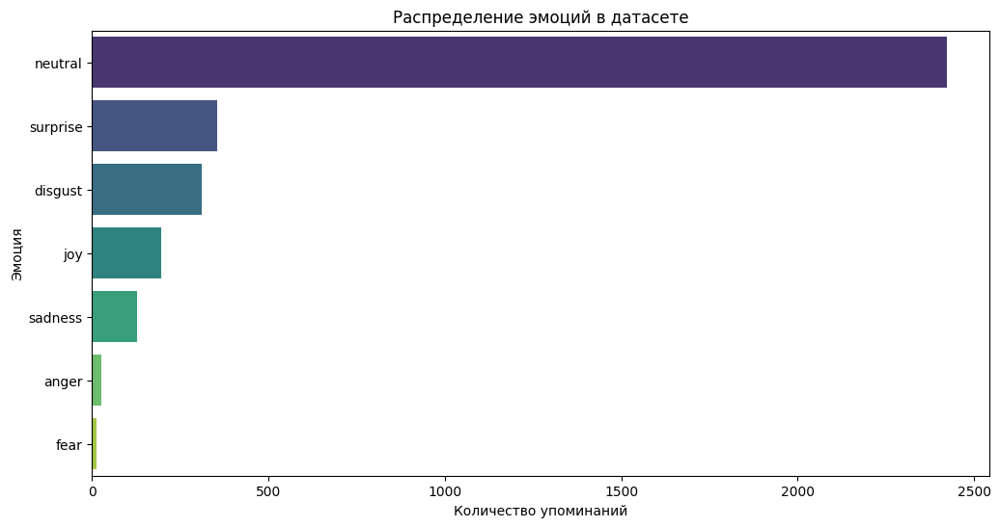

In [46]:
emotion_columns = EMOTIONS #['Angry', 'Disgusted', 'Happy', 'Neutral', 'Sad', 'Scared', 'Surprised']

emotion_counts = df[emotion_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")
plt.title("Распределение эмоций в датасете")
plt.xlabel("Количество упоминаний")
plt.ylabel("Эмоция")
plt.show()


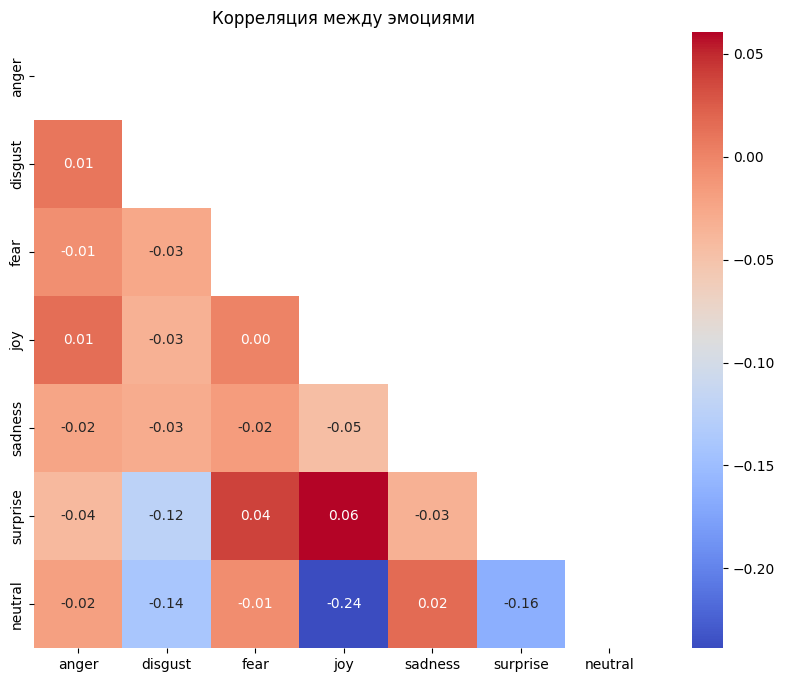

In [47]:
plt.figure(figsize=(10, 8))
corr_matrix = df[emotion_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Корреляция между эмоциями")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_303092\373759033.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='num_emotions', data=df, palette="rocket")


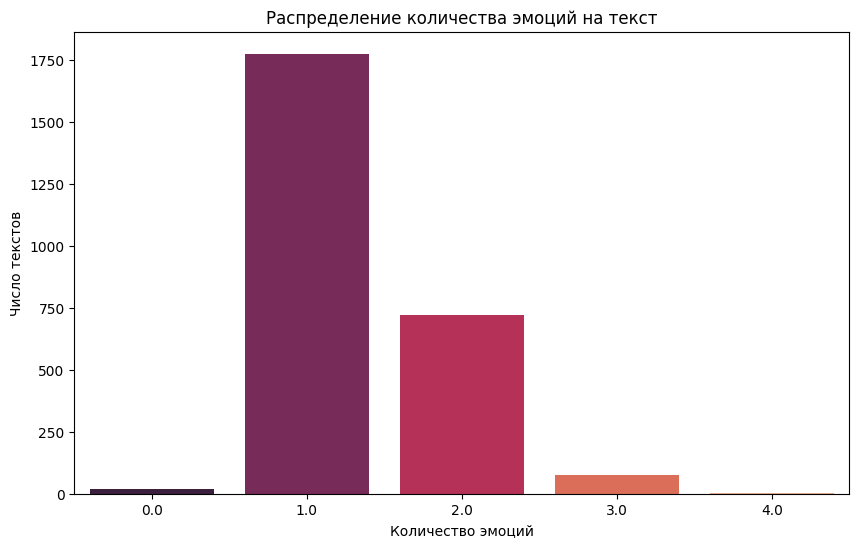

In [48]:
df['num_emotions'] = df[emotion_columns].sum(axis=1)
plt.figure(figsize=(10, 6))
sns.countplot(x='num_emotions', data=df, palette="rocket")
plt.title("Распределение количества эмоций на текст")
plt.xlabel("Количество эмоций")
plt.ylabel("Число текстов")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_303092\3648161424.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


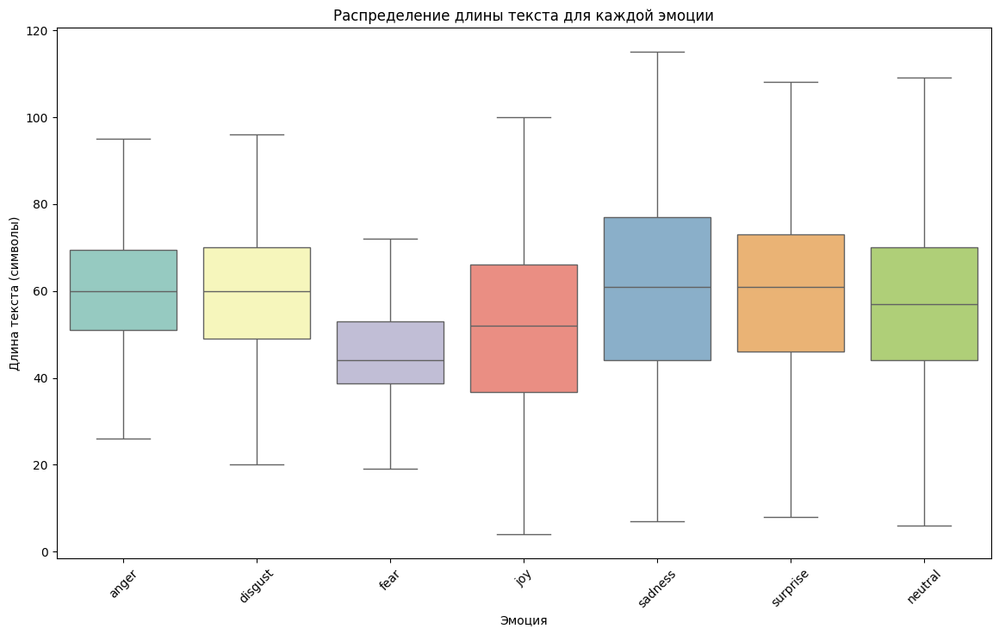

In [49]:
df['text_length'] = df['text'].apply(len)

# Преобразуем данные и фильтруем только случаи, где эмоция присутствует (is_present = 1)
melted_df = pd.melt(
    df, 
    id_vars=['text_length'], 
    value_vars=emotion_columns, 
    var_name='emotion', 
    value_name='is_present'
)

# Фильтрация строк с активными эмоциями (is_present == 1)
filtered_df = melted_df[melted_df['is_present'] == 1]

# Построение графика
plt.figure(figsize=(14, 8))
sns.boxplot(
    x='emotion', 
    y='text_length', 
    data=filtered_df, 
    palette="Set3", 
    showfliers=False  # Убираем выбросы для наглядности
)
plt.title("Распределение длины текста для каждой эмоции")
plt.xlabel("Эмоция")
plt.ylabel("Длина текста (символы)")
plt.xticks(rotation=45)
plt.show()

Общее количество слов: 18,815
Уникальные слова: 5,311
Топ-10 частых слов:
сегодня: 347
это: 306
бригада: 230
двадцать: 229
дежурная: 227
уважаемая: 216
спасибо: 188
очень: 181
апреля: 149
е: 145


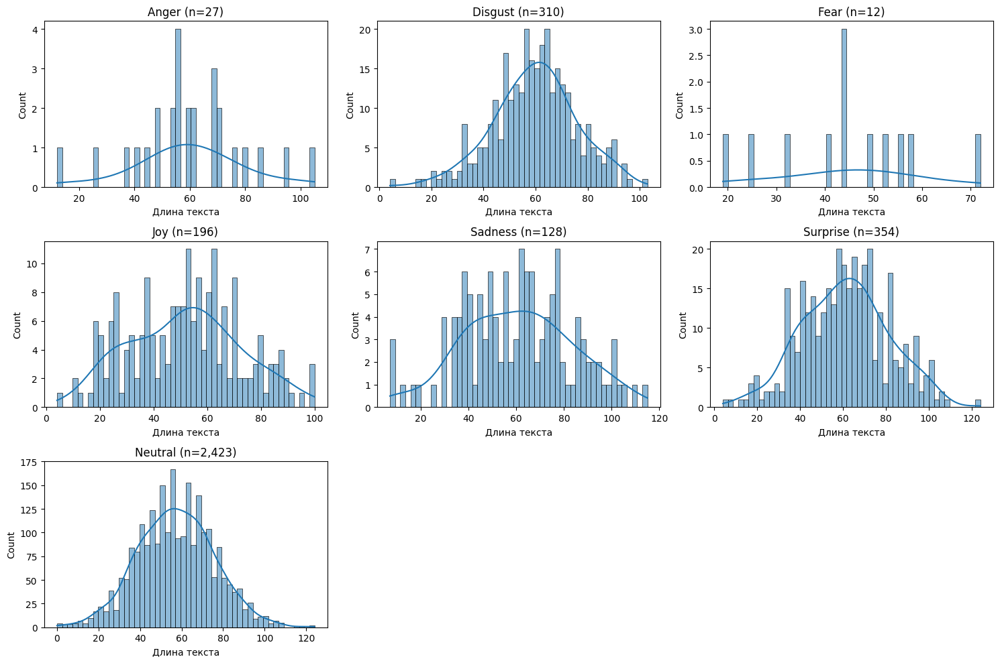

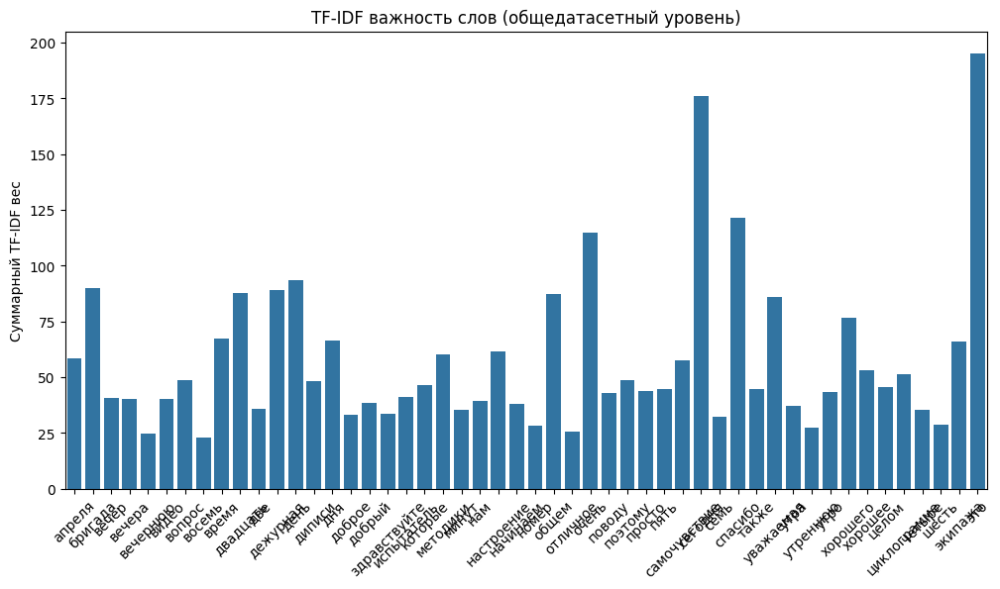

C:\Users\rvv19\AppData\Local\Temp\ipykernel_303092\578283711.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_303092\578283711.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_303092\578283711.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_303092\578283711.py:54: FutureWa

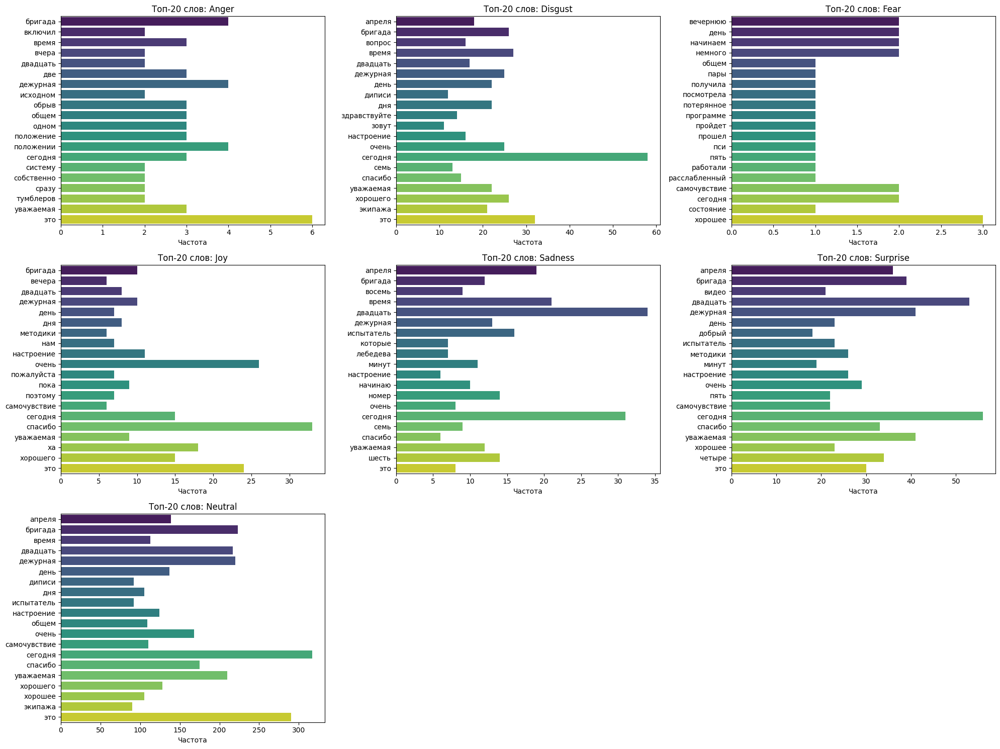


Количество уникальных слов по эмоциям:
anger: 38
disgust: 432
fear: 6
joy: 341
sadness: 165
surprise: 461
neutral: 4,539


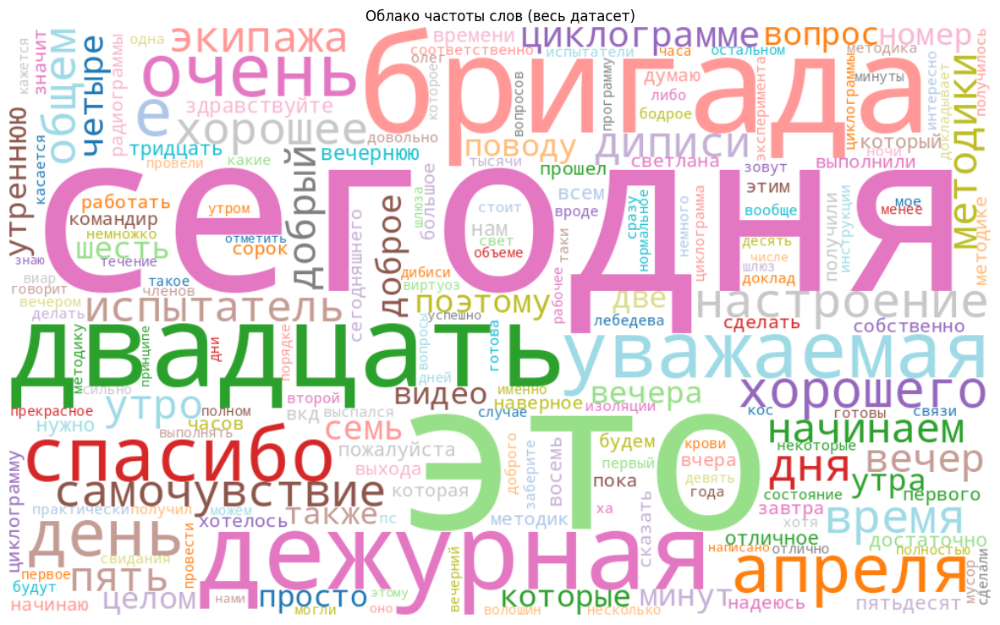

In [50]:
#Общая статистика
all_words = ' '.join(df['text']).split()
word_freq = Counter(all_words)

print(f"Общее количество слов: {len(all_words):,}")
print(f"Уникальные слова: {len(word_freq):,}")
print(f"Топ-10 частых слов:")
for word, freq in word_freq.most_common(10):
    print(f"{word}: {freq}")

#Анализ по эмоциям
plt.figure(figsize=(15, 10))

#Распределение длины текстов
for i, emotion in enumerate(emotion_columns, 1):
    subset = df[df[emotion] == 1]
    plt.subplot(3, 3, i)
    sns.histplot(subset['text'].apply(len), bins=50, kde=True)
    plt.title(f'{emotion.capitalize()} (n={len(subset):,})')
    plt.xlabel('Длина текста')

plt.tight_layout()
plt.show()

# 4. TF-IDF анализ для уникальных слов
tfidf = TfidfVectorizer(max_features=50)
tfidf_matrix = tfidf.fit_transform(df['text'])
feature_names = tfidf.get_feature_names_out()

# Визуализация TF-IDF
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_names, y=tfidf_matrix.sum(axis=0).A1)
plt.xticks(rotation=45)
plt.title('TF-IDF важность слов (общедатасетный уровень)')
plt.ylabel('Суммарный TF-IDF вес')
plt.show()

#Уникальные слова для каждой эмоции
plt.figure(figsize=(20, 15))

for idx, emotion in enumerate(emotion_columns, 1):
    # Фильтрация текстов для эмоции
    emotion_texts = df[df[emotion] == 1]['text']
    if len(emotion_texts)==0:
        continue
    # Расчет частоты слов
    vectorizer = CountVectorizer(max_features=20)
    matrix = vectorizer.fit_transform(emotion_texts)
    words = vectorizer.get_feature_names_out()
    frequencies = matrix.sum(axis=0).A1
    
    # Визуализация
    plt.subplot(3, 3, idx)
    sns.barplot(x=frequencies, y=words, palette='viridis')
    plt.title(f'Топ-20 слов: {emotion.capitalize()}')
    plt.xlabel('Частота')

plt.tight_layout()
plt.show()

# Матрица уникальности слов
unique_words = {}
for emotion in emotion_columns:
    emotion_words = set(' '.join(df[df[emotion] == 1]['text']).split())
    other_words = set(' '.join(df[df[emotion] == 0]['text']).split())
    unique_words[emotion] = emotion_words - other_words

print("\nКоличество уникальных слов по эмоциям:")
for emotion, words in unique_words.items():
    print(f"{emotion}: {len(words):,}")

#Word Frequency Cloud
plt.figure(figsize=(15, 10))
wc = WordCloud(width=1000, height=600, background_color='white', colormap='tab20')
wc.generate_from_frequencies(word_freq)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Облако частоты слов (весь датасет)')
plt.show()

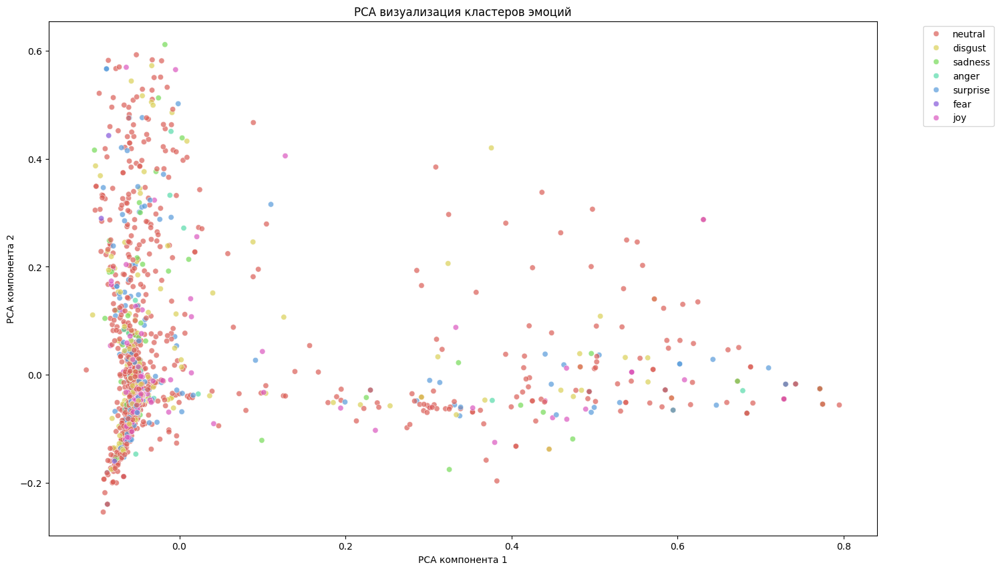

In [51]:
# Выберем доминирующую эмоцию для каждого текста
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)
# Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(df['text'])
# Уменьшение размерности с помощью PCA 
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X.toarray())
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_pca, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('PCA визуализация кластеров эмоций')
plt.xlabel('PCA компонента 1')
plt.ylabel('PCA компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

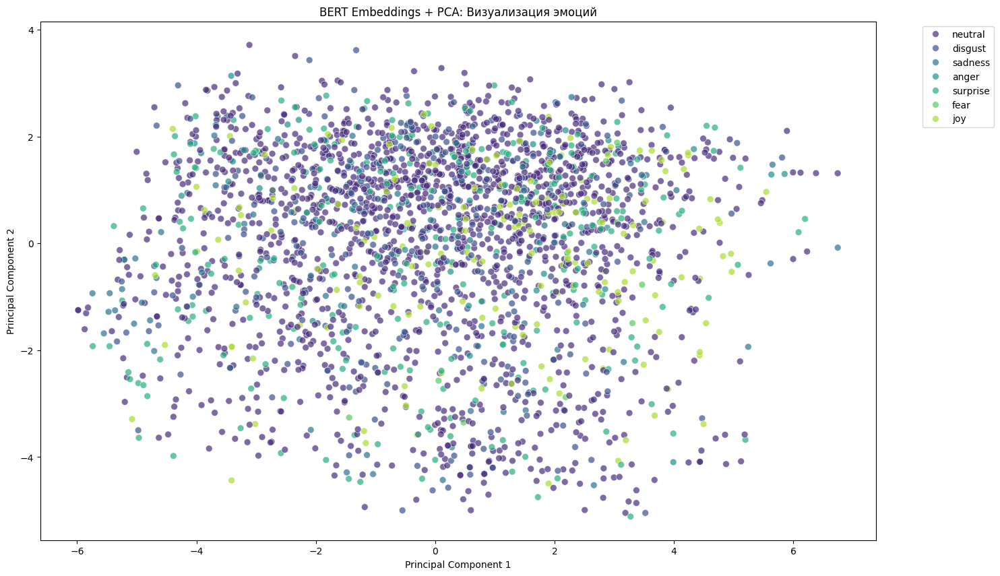

In [52]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Загрузка предобученной модели и токенизатора
model_name = 'sergeyzh/rubert-tiny-turbo'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# 2. Функция для получения BERT-эмбеддингов
def get_bert_embeddings(texts, batch_size=16):
    model.eval()
    embeddings = []
    
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        
        # Токенизация
        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        )
        
        # Получение эмбеддингов
        with torch.no_grad():
            outputs = model(**inputs)
        
        # Используем усредненные эмбеддинги последнего слоя
        batch_embeddings = outputs.last_hidden_state.mean(dim=1).cpu().numpy()
        embeddings.append(batch_embeddings)
    
    return np.vstack(embeddings)

# 3. Получение эмбеддингов для всего датасета
texts = df['text'].tolist()
embeddings = get_bert_embeddings(texts)

# 4. Уменьшение размерности с помощью PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(embeddings)
# 5. Подготовка данных для визуализации
df['pca1'] = pca_result[:, 0]
df['pca2'] = pca_result[:, 1]
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)

# 6. Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='pca1', 
    y='pca2',
    hue='dominant_emotion',
    palette='viridis',
    data=df,
    alpha=0.7,
    s=50
)

plt.title('BERT Embeddings + PCA: Визуализация эмоций')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

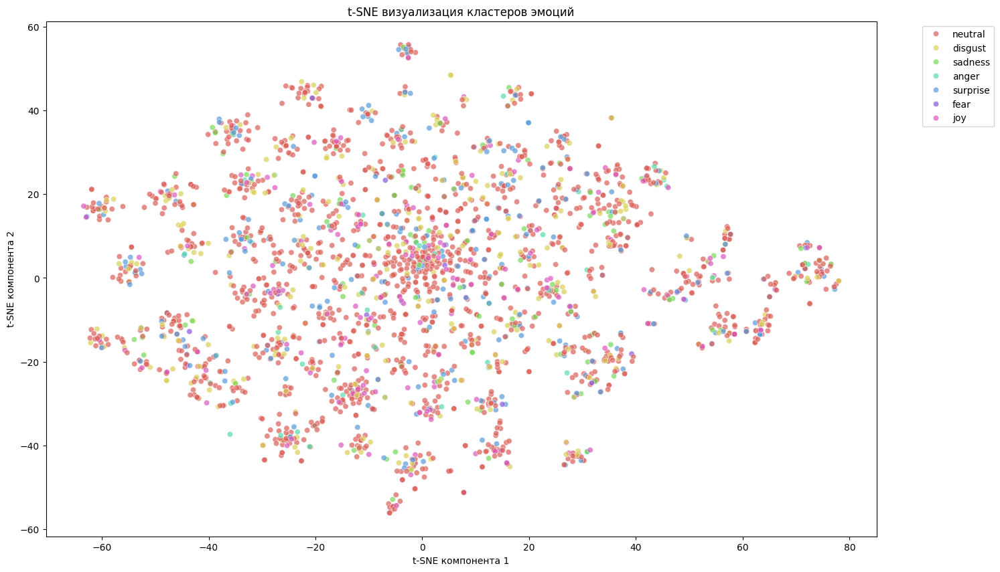

In [53]:
# Выберем доминирующую эмоцию для каждого текста
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)
# Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(df['text'])
# Уменьшение размерности с помощью PCA 
pca = PCA(n_components=100, random_state=42)
X_pca = pca.fit_transform(X.toarray())
# Применение t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(X_pca)
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_tsne, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('t-SNE визуализация кластеров эмоций')
plt.xlabel('t-SNE компонента 1')
plt.ylabel('t-SNE компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# GoEmotion(djacon)

In [25]:
df = pd.read_csv('goemo.csv')

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211225 entries, 0 to 211224
Data columns (total 8 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   text      211225 non-null  object
 1   anger     211225 non-null  int64 
 2   disgust   211225 non-null  int64 
 3   fear      211225 non-null  int64 
 4   joy       211225 non-null  int64 
 5   sadness   211225 non-null  int64 
 6   surprise  211225 non-null  int64 
 7   neutral   211225 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 12.9+ MB


In [6]:
df.head(10)

,Video Time,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal,Video Filename,dom_emo,emotion_category
0,00:00:00.000,0.444312,0.000134,0.118632,0.018229,0.413666,0.001528,0.003500,-0.146107,0.559860,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
1,00:00:00.033,0.444096,0.000134,0.118749,0.018232,0.413761,0.001527,0.003501,-0.146127,0.559860,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
2,00:00:00.066,0.444390,0.000136,0.119138,0.018228,0.413063,0.001522,0.003523,-0.146377,0.559860,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
3,00:00:00.100,0.444377,0.000139,0.119348,0.018185,0.412902,0.001516,0.003533,-0.146374,0.559948,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
4,00:00:00.133,0.444295,0.000143,0.119497,0.018130,0.412892,0.001508,0.003536,-0.146227,0.560099,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
5,00:00:00.166,0.444104,0.000148,0.119882,0.018026,0.412813,0.001496,0.003529,-0.146328,0.560345,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
6,00:00:00.200,0.443721,0.000156,0.120650,0.017886,0.412587,0.001485,0.003515,-0.146896,0.560524,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
7,00:00:00.233,0.442149,0.000164,0.121909,0.017697,0.413106,0.001488,0.003486,-0.148083,0.560524,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
8,00:00:00.266,0.439189,0.000173,0.123584,0.017461,0.414617,0.001521,0.003454,-0.149752,0.560495,Минутные видео по сегментам (без звука)/2021-0...,NaN,2
9,00:00:00.300,0.434981,0.000186,0.126034,0.017160,0.416614,0.001588,0.003438,-0.152316,0.560433,Минутные видео по сегментам (без звука)/2021-0...,NaN,2


In [20]:
df['text'] = df['text'].apply(cleaner)

In [21]:
df.head(50)

,text,anger,disgust,fear,joy,sadness,surprise,neutral
0,эта игра причинила боль,0,0,0,0,1,0,0
1,>сексуальность должна групповой категорией отл...,0,0,0,0,0,0,0
2,правильно поступаешь тебе равно иди черту,0,0,0,0,0,0,1
3,чувак обожаю reddit,0,0,0,1,0,0,0
4,[имя] рядом ними рядом «соколом»,0,0,0,0,0,0,1
5,верно? учитывая это важный документ должен зна...,0,0,0,1,0,0,0
6,большой довольно популярный слышал самое содер...,1,0,0,0,0,0,0
7,это безумие училась супер [религийной] средней...,0,0,0,1,0,0,0
8,это очень мило,0,0,0,1,0,0,0
9,«пабы sponge blurb quaw haha gurr ha aaa» фина...,0,0,0,1,0,0,0


C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\3070234706.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")


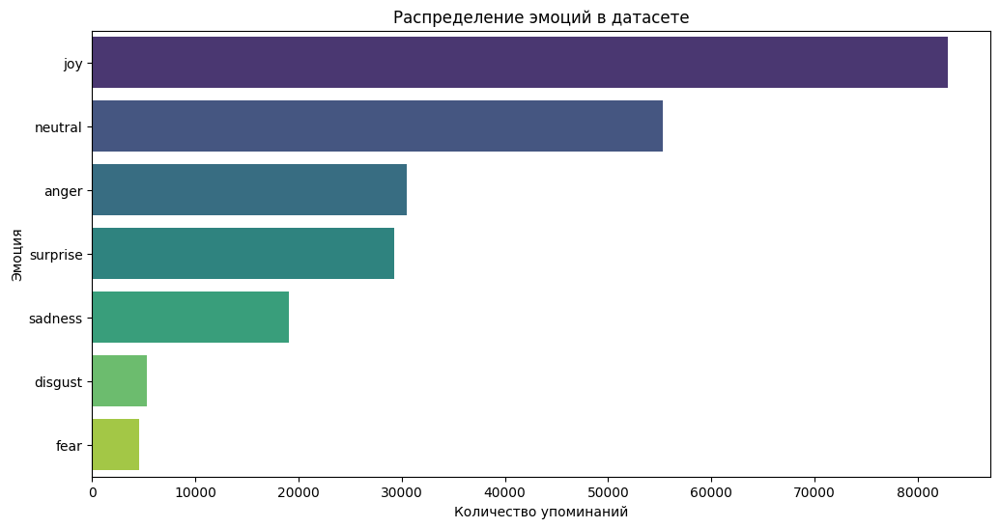

In [ ]:
emotion_columns = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'neutral']
emotion_counts = df[emotion_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")
plt.title("Распределение эмоций в датасете")
plt.xlabel("Количество упоминаний")
plt.ylabel("Эмоция")
plt.show()

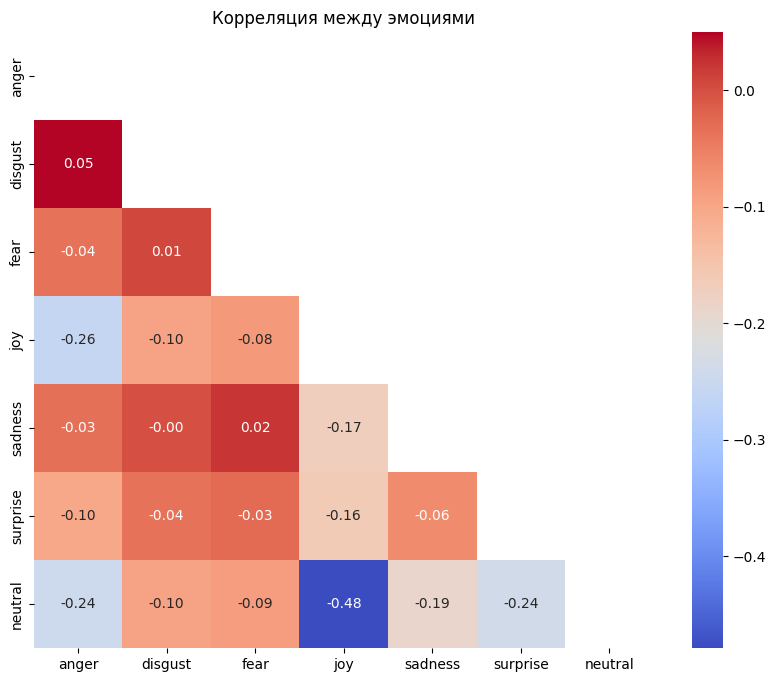

In [23]:
plt.figure(figsize=(10, 8))
corr_matrix = df[emotion_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Корреляция между эмоциями")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\373759033.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='num_emotions', data=df, palette="rocket")


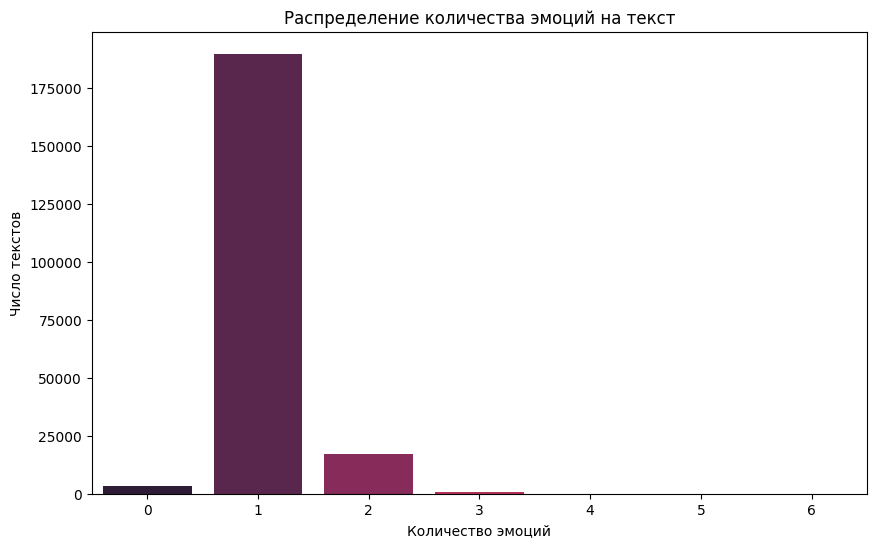

In [24]:
df['num_emotions'] = df[emotion_columns].sum(axis=1)
plt.figure(figsize=(10, 6))
sns.countplot(x='num_emotions', data=df, palette="rocket")
plt.title("Распределение количества эмоций на текст")
plt.xlabel("Количество эмоций")
plt.ylabel("Число текстов")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\3648161424.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


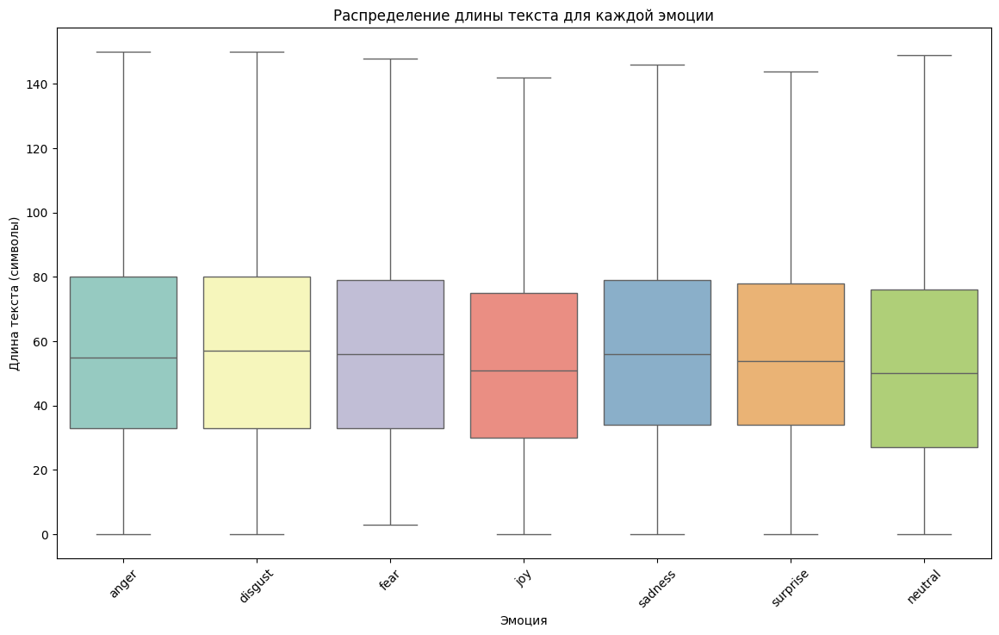

In [25]:
df['text_length'] = df['text'].apply(len)

# Преобразуем данные и фильтруем только случаи, где эмоция присутствует (is_present = 1)
melted_df = pd.melt(
    df, 
    id_vars=['text_length'], 
    value_vars=emotion_columns, 
    var_name='emotion', 
    value_name='is_present'
)

# Фильтрация строк с активными эмоциями (is_present == 1)
filtered_df = melted_df[melted_df['is_present'] == 1]

# Построение графика
plt.figure(figsize=(14, 8))
sns.boxplot(
    x='emotion', 
    y='text_length', 
    data=filtered_df, 
    palette="Set3", 
    showfliers=False  # Убираем выбросы для наглядности
)
plt.title("Распределение длины текста для каждой эмоции")
plt.xlabel("Эмоция")
plt.ylabel("Длина текста (символы)")
plt.xticks(rotation=45)
plt.show()

Общее количество слов: 1,549,363
Уникальные слова: 69,896
Топ-10 частых слов:
это: 69322
[имя]: 35371
просто: 12270
спасибо: 9304
очень: 8848
думаю: 5888
—: 5702
нравится: 4984
могу: 4921
действительно: 4675


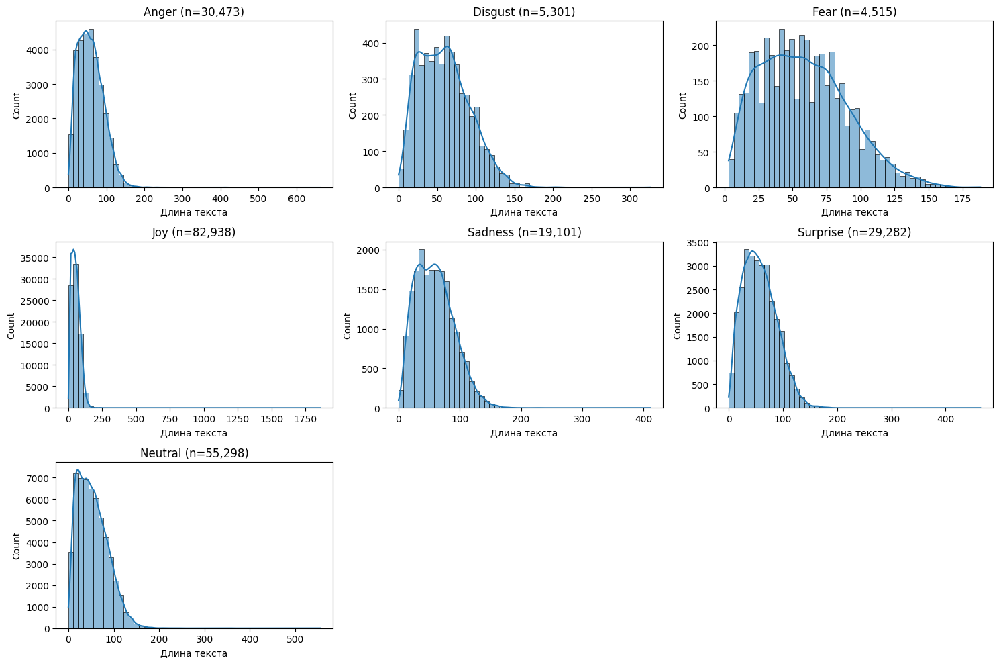

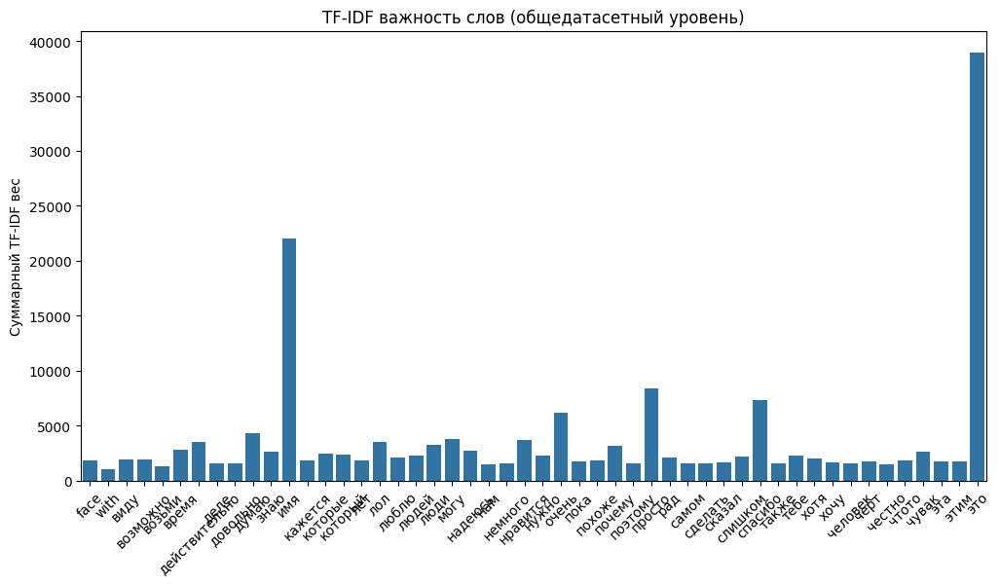

C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\2289890677.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\2289890677.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\2289890677.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\2289890677.py:54: Futu

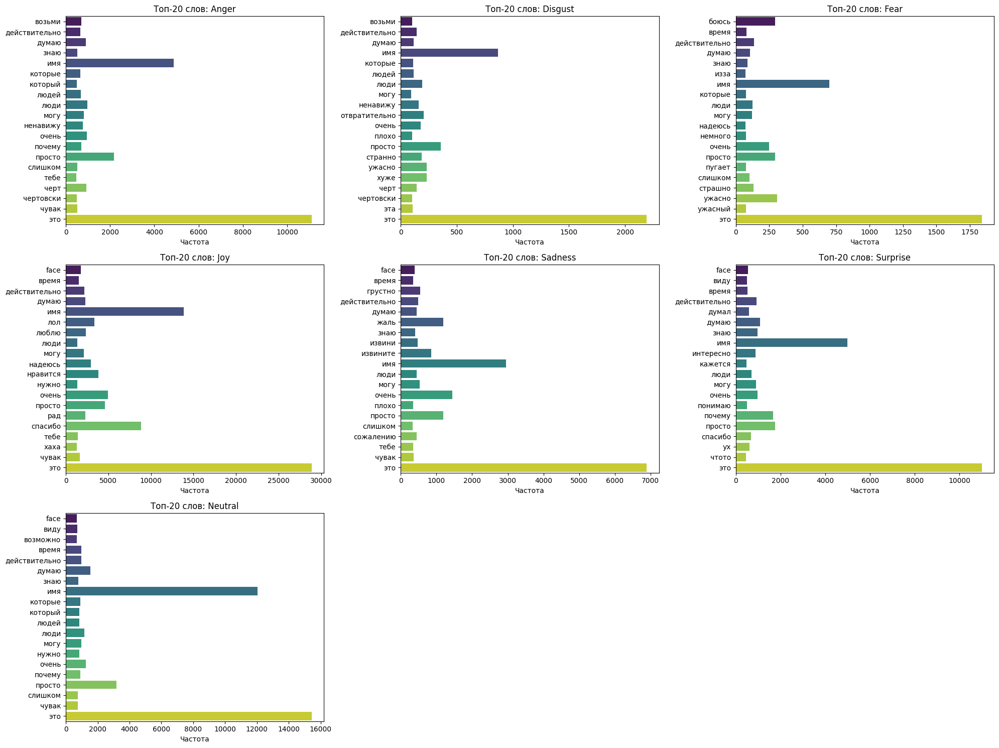


Количество уникальных слов по эмоциям:
anger: 1,124
disgust: 100
fear: 152
joy: 6,877
sadness: 651
surprise: 1,462
neutral: 3,190


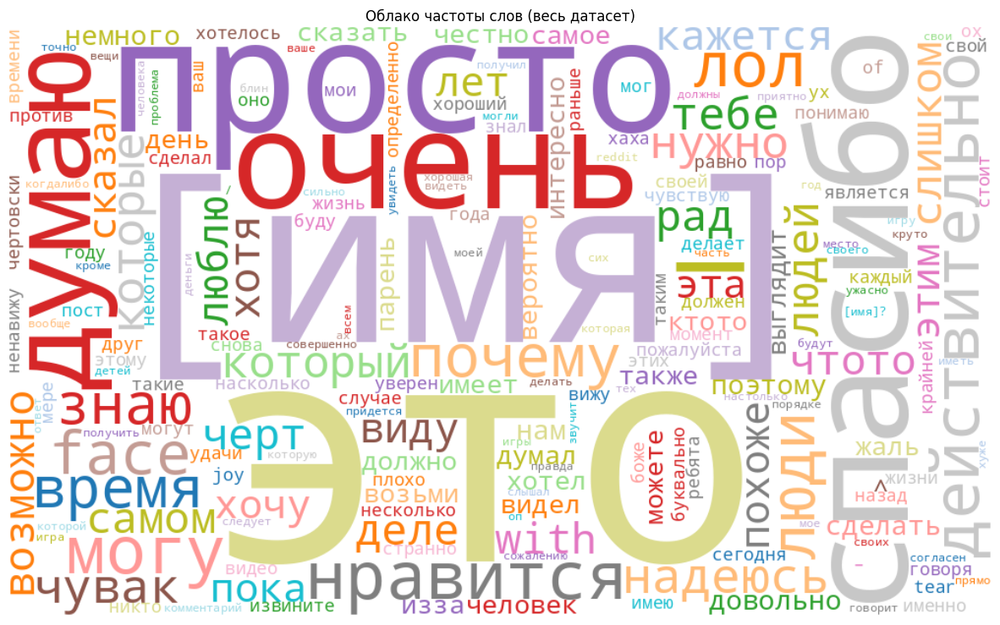

In [26]:

#Общая статистика
all_words = ' '.join(df['text']).split()
word_freq = Counter(all_words)

print(f"Общее количество слов: {len(all_words):,}")
print(f"Уникальные слова: {len(word_freq):,}")
print(f"Топ-10 частых слов:")
for word, freq in word_freq.most_common(10):
    print(f"{word}: {freq}")

#Анализ по эмоциям
plt.figure(figsize=(15, 10))

#Распределение длины текстов
for i, emotion in enumerate(EMOTIONS, 1):
    subset = df[df[emotion] == 1]
    plt.subplot(3, 3, i)
    sns.histplot(subset['text'].apply(len), bins=50, kde=True)
    plt.title(f'{emotion.capitalize()} (n={len(subset):,})')
    plt.xlabel('Длина текста')

plt.tight_layout()
plt.show()

# 4. TF-IDF анализ для уникальных слов
tfidf = TfidfVectorizer(max_features=50)
tfidf_matrix = tfidf.fit_transform(df['text'])
feature_names = tfidf.get_feature_names_out()

# Визуализация TF-IDF
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_names, y=tfidf_matrix.sum(axis=0).A1)
plt.xticks(rotation=45)
plt.title('TF-IDF важность слов (общедатасетный уровень)')
plt.ylabel('Суммарный TF-IDF вес')
plt.show()

#Уникальные слова для каждой эмоции
plt.figure(figsize=(20, 15))

for idx, emotion in enumerate(EMOTIONS, 1):
    # Фильтрация текстов для эмоции
    emotion_texts = df[df[emotion] == 1]['text']
    if len(emotion_texts)==0:
        continue
    # Расчет частоты слов
    vectorizer = CountVectorizer(max_features=20)
    matrix = vectorizer.fit_transform(emotion_texts)
    words = vectorizer.get_feature_names_out()
    frequencies = matrix.sum(axis=0).A1
    
    # Визуализация
    plt.subplot(3, 3, idx)
    sns.barplot(x=frequencies, y=words, palette='viridis')
    plt.title(f'Топ-20 слов: {emotion.capitalize()}')
    plt.xlabel('Частота')

plt.tight_layout()
plt.show()

# Матрица уникальности слов
unique_words = {}
for emotion in EMOTIONS:
    emotion_words = set(' '.join(df[df[emotion] == 1]['text']).split())
    other_words = set(' '.join(df[df[emotion] == 0]['text']).split())
    unique_words[emotion] = emotion_words - other_words

print("\nКоличество уникальных слов по эмоциям:")
for emotion, words in unique_words.items():
    print(f"{emotion}: {len(words):,}")

#Word Frequency Cloud
plt.figure(figsize=(15, 10))
wc = WordCloud(width=1000, height=600, background_color='white', colormap='tab20')
wc.generate_from_frequencies(word_freq)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Облако частоты слов (весь датасет)')
plt.show()

In [27]:
# Выберем доминирующую эмоцию для каждого текста
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)

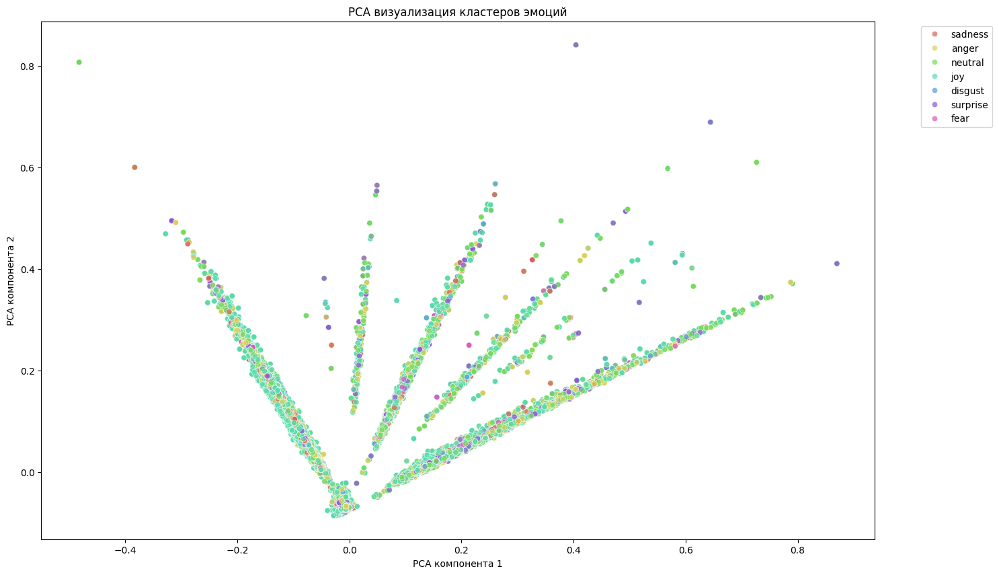

In [32]:
# Выберем доминирующую эмоцию для каждого текста
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)
# Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(df['text'])
# Уменьшение размерности с помощью PCA 
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X.toarray())
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_pca, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('PCA визуализация кластеров эмоций')
plt.xlabel('PCA компонента 1')
plt.ylabel('PCA компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

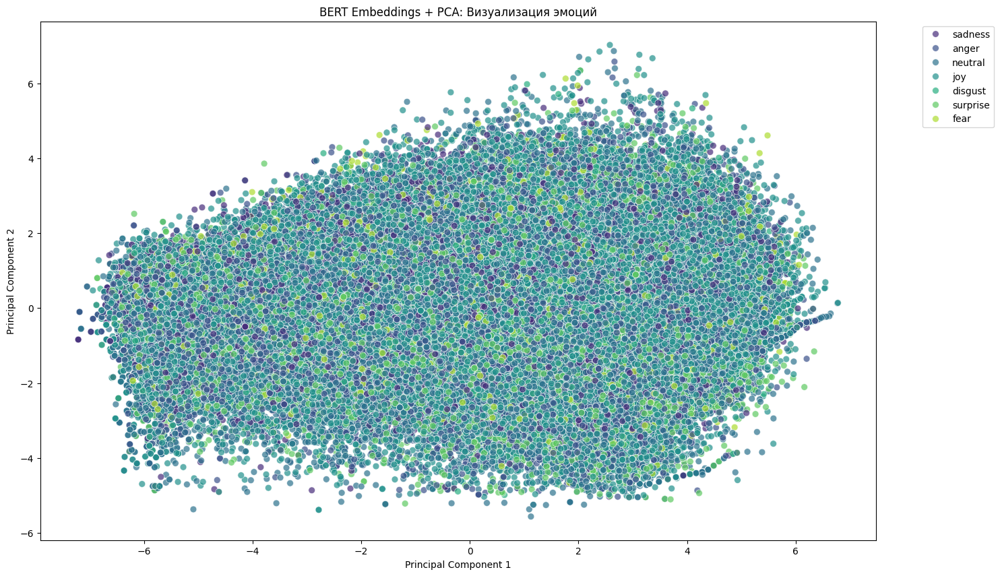

In [34]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Загрузка предобученной модели и токенизатора
model_name = 'sergeyzh/rubert-tiny-turbo'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# 2. Функция для получения BERT-эмбеддингов
def get_bert_embeddings(texts, batch_size=16):
    model.eval()
    embeddings = []
    
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        
        # Токенизация
        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        )
        
        # Получение эмбеддингов
        with torch.no_grad():
            outputs = model(**inputs)
        
        # Используем усредненные эмбеддинги последнего слоя
        batch_embeddings = outputs.last_hidden_state.mean(dim=1).cpu().numpy()
        embeddings.append(batch_embeddings)
    
    return np.vstack(embeddings)

# 3. Получение эмбеддингов для всего датасета
texts = df['text'].tolist()
embeddings = get_bert_embeddings(texts)

# 4. Уменьшение размерности с помощью PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(embeddings)
# 5. Подготовка данных для визуализации
df['pca1'] = pca_result[:, 0]
df['pca2'] = pca_result[:, 1]
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)

# 6. Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='pca1', 
    y='pca2',
    hue='dominant_emotion',
    palette='viridis',
    data=df,
    alpha=0.7,
    s=50
)

plt.title('BERT Embeddings + PCA: Визуализация эмоций')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# CEDR

In [20]:
df = pd.read_csv('cedr.csv')

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7528 entries, 0 to 7527
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   text      7528 non-null   object
 1   anger     7528 non-null   int64 
 2   disgust   7528 non-null   int64 
 3   fear      7528 non-null   int64 
 4   joy       7528 non-null   int64 
 5   sadness   7528 non-null   int64 
 6   surprise  7528 non-null   int64 
 7   neutral   7528 non-null   int64 
dtypes: int64(7), object(1)
memory usage: 470.6+ KB


In [22]:
df['text'] = df['text'].apply(cleaner)

In [23]:
df.sample(20)

,text,anger,disgust,fear,joy,sadness,surprise,neutral
4763,ксюша сочиняет добрые рифмыа даша злые,0,0,0,1,0,0,0
4611,боюсь,0,0,1,0,0,0,0
5997,принят обращение синодальным определением лишь...,0,0,0,0,0,0,1
4378,станешь понастоящему счастливым добьёшься хотел,0,0,0,0,0,0,1
6303,ужасные новости ппц,0,0,0,0,1,0,0
6346,мужчиной бояться опираться мужскую руку боятьс...,0,0,0,0,0,0,1
7318,любимая дурочка учит пары хватает ужасные оценки,0,0,0,0,1,0,0
245,клэр уэйт келлер clare waight keller — автор п...,0,0,0,0,0,0,1
6396,пока жива системадракон умрет,0,0,0,0,1,0,0
3698,одной стороны это плохо — стоять ждать пять ми...,0,0,0,0,0,1,0


C:\Users\rvv19\AppData\Local\Temp\ipykernel_38356\3070234706.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")


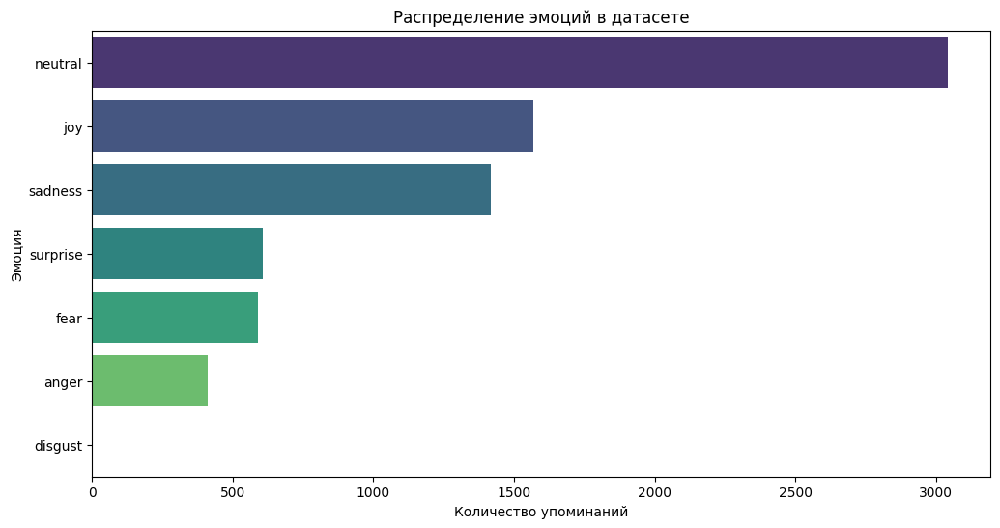

In [24]:
emotion_columns = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'neutral']
emotion_counts = df[emotion_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")
plt.title("Распределение эмоций в датасете")
plt.xlabel("Количество упоминаний")
plt.ylabel("Эмоция")
plt.show()

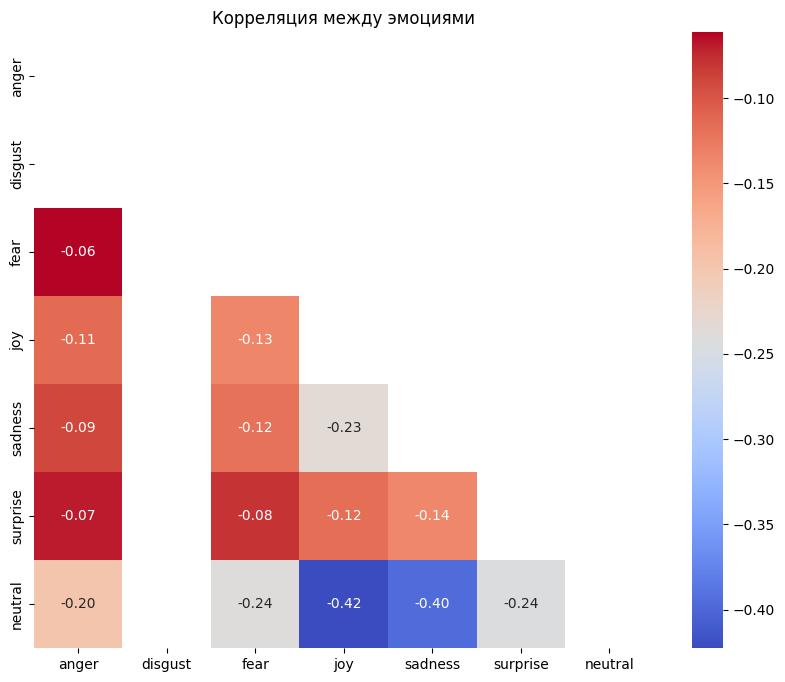

In [25]:
plt.figure(figsize=(10, 8))
corr_matrix = df[emotion_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Корреляция между эмоциями")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_38356\373759033.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='num_emotions', data=df, palette="rocket")


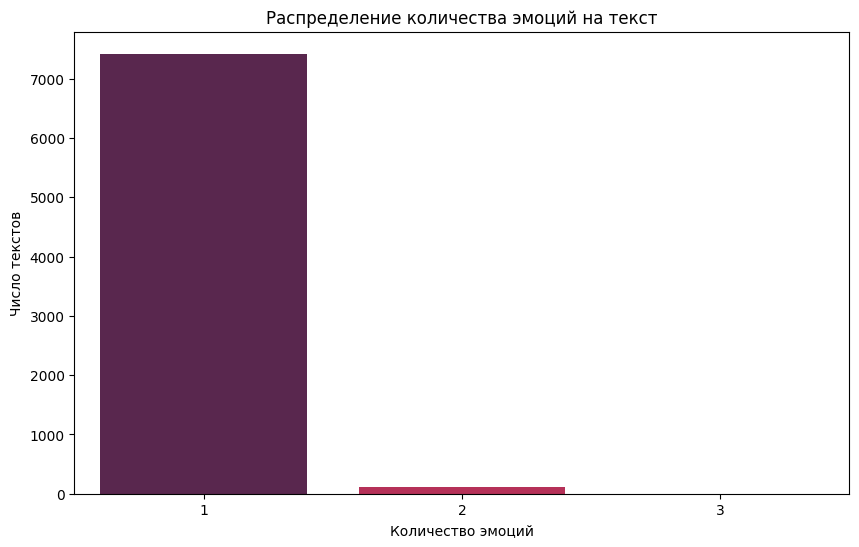

In [26]:
df['num_emotions'] = df[emotion_columns].sum(axis=1)
plt.figure(figsize=(10, 6))
sns.countplot(x='num_emotions', data=df, palette="rocket")
plt.title("Распределение количества эмоций на текст")
plt.xlabel("Количество эмоций")
plt.ylabel("Число текстов")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\3648161424.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


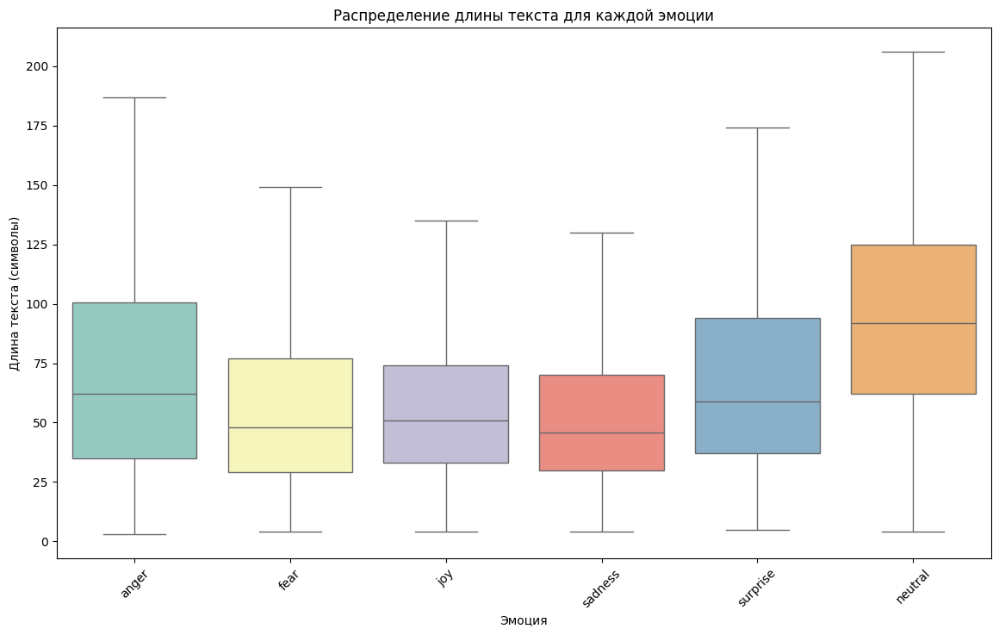

In [34]:
df['text_length'] = df['text'].apply(len)

# Преобразуем данные и фильтруем только случаи, где эмоция присутствует (is_present = 1)
melted_df = pd.melt(
    df, 
    id_vars=['text_length'], 
    value_vars=emotion_columns, 
    var_name='emotion', 
    value_name='is_present'
)

# Фильтрация строк с активными эмоциями (is_present == 1)
filtered_df = melted_df[melted_df['is_present'] == 1]

# Построение графика
plt.figure(figsize=(14, 8))
sns.boxplot(
    x='emotion', 
    y='text_length', 
    data=filtered_df, 
    palette="Set3", 
    showfliers=False  # Убираем выбросы для наглядности
)
plt.title("Распределение длины текста для каждой эмоции")
plt.xlabel("Эмоция")
plt.ylabel("Длина текста (символы)")
plt.xticks(rotation=45)
plt.show()

Общее количество слов: 69,003
Уникальные слова: 29,225
Топ-10 частых слов:
это: 640
—: 528
": 285
очень: 266
»: 187
«: 183
боюсь: 180
–: 176
просто: 160
время: 156


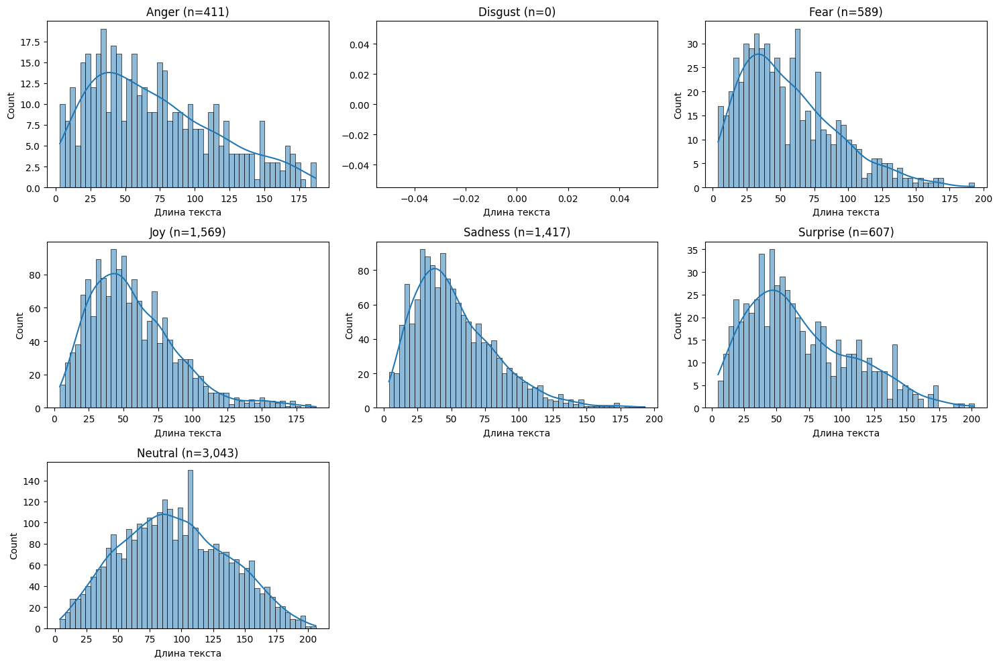

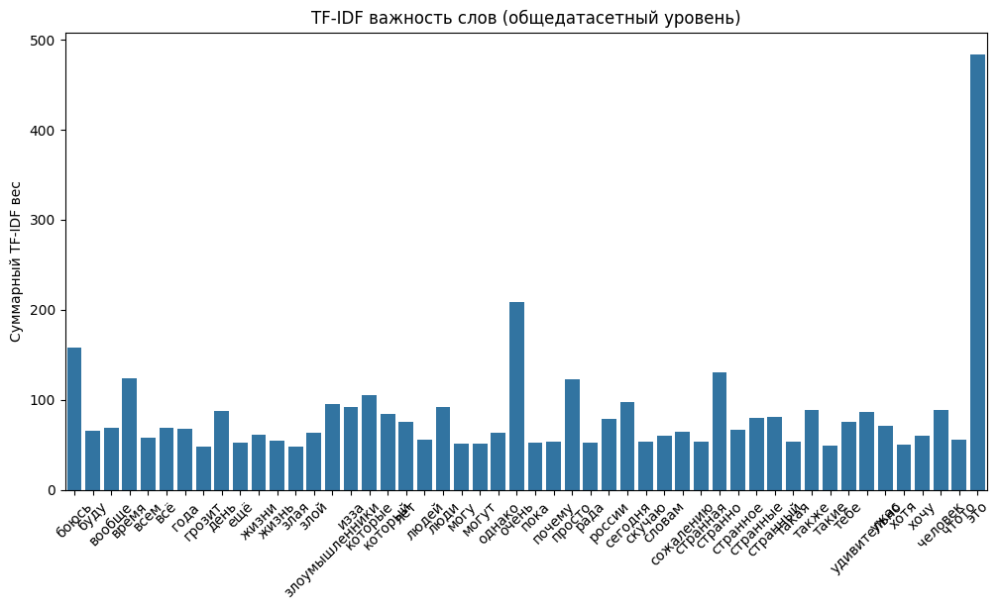

C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\2289890677.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\2289890677.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\2289890677.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\2289890677.py:54: Futu

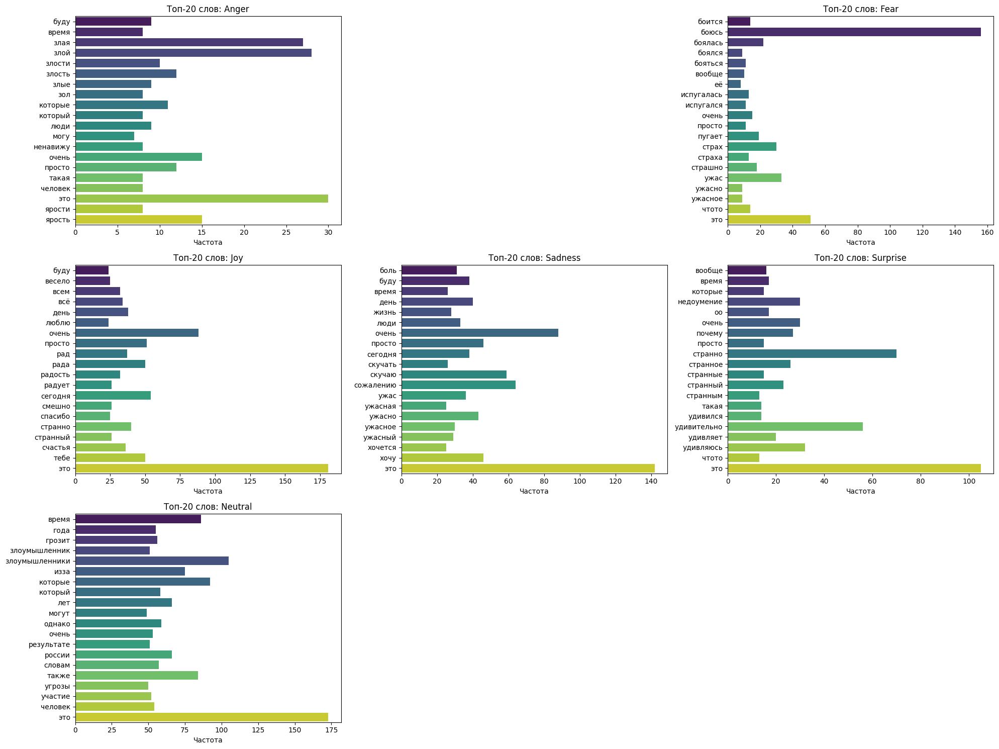


Количество уникальных слов по эмоциям:
anger: 1,278
disgust: 0
fear: 1,273
joy: 3,862
sadness: 3,013
surprise: 1,528
neutral: 12,805


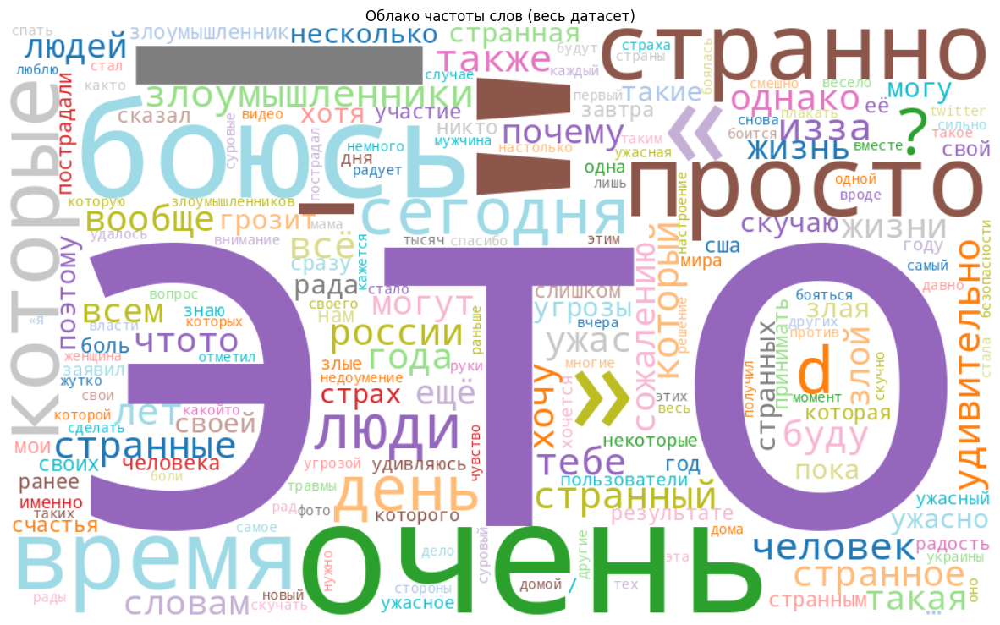

In [35]:

#Общая статистика
all_words = ' '.join(df['text']).split()
word_freq = Counter(all_words)

print(f"Общее количество слов: {len(all_words):,}")
print(f"Уникальные слова: {len(word_freq):,}")
print(f"Топ-10 частых слов:")
for word, freq in word_freq.most_common(10):
    print(f"{word}: {freq}")

#Анализ по эмоциям
plt.figure(figsize=(15, 10))

#Распределение длины текстов
for i, emotion in enumerate(EMOTIONS, 1):
    subset = df[df[emotion] == 1]
    plt.subplot(3, 3, i)
    sns.histplot(subset['text'].apply(len), bins=50, kde=True)
    plt.title(f'{emotion.capitalize()} (n={len(subset):,})')
    plt.xlabel('Длина текста')

plt.tight_layout()
plt.show()

# 4. TF-IDF анализ для уникальных слов
tfidf = TfidfVectorizer(max_features=50)
tfidf_matrix = tfidf.fit_transform(df['text'])
feature_names = tfidf.get_feature_names_out()

# Визуализация TF-IDF
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_names, y=tfidf_matrix.sum(axis=0).A1)
plt.xticks(rotation=45)
plt.title('TF-IDF важность слов (общедатасетный уровень)')
plt.ylabel('Суммарный TF-IDF вес')
plt.show()

#Уникальные слова для каждой эмоции
plt.figure(figsize=(20, 15))

for idx, emotion in enumerate(EMOTIONS, 1):
    # Фильтрация текстов для эмоции
    emotion_texts = df[df[emotion] == 1]['text']
    if len(emotion_texts)==0:
        continue
    # Расчет частоты слов
    vectorizer = CountVectorizer(max_features=20)
    matrix = vectorizer.fit_transform(emotion_texts)
    words = vectorizer.get_feature_names_out()
    frequencies = matrix.sum(axis=0).A1
    
    # Визуализация
    plt.subplot(3, 3, idx)
    sns.barplot(x=frequencies, y=words, palette='viridis')
    plt.title(f'Топ-20 слов: {emotion.capitalize()}')
    plt.xlabel('Частота')

plt.tight_layout()
plt.show()

# Матрица уникальности слов
unique_words = {}
for emotion in EMOTIONS:
    emotion_words = set(' '.join(df[df[emotion] == 1]['text']).split())
    other_words = set(' '.join(df[df[emotion] == 0]['text']).split())
    unique_words[emotion] = emotion_words - other_words

print("\nКоличество уникальных слов по эмоциям:")
for emotion, words in unique_words.items():
    print(f"{emotion}: {len(words):,}")

#Word Frequency Cloud
plt.figure(figsize=(15, 10))
wc = WordCloud(width=1000, height=600, background_color='white', colormap='tab20')
wc.generate_from_frequencies(word_freq)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Облако частоты слов (весь датасет)')
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_148168\4022353680.py:15: UserWarning: The palette list has more values (7) than needed (6), which may not be intended.
  sns.scatterplot(


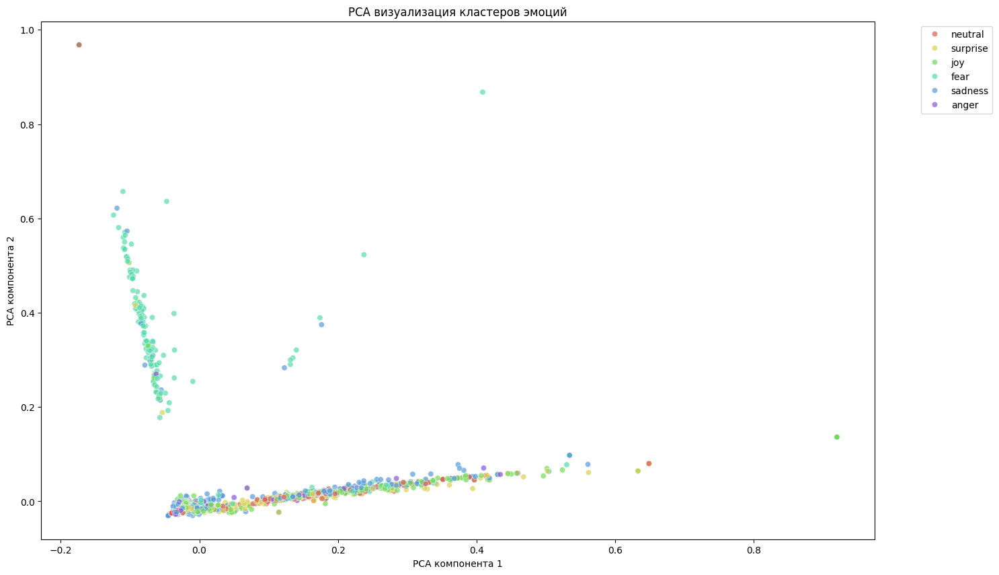

In [43]:
# Выберем доминирующую эмоцию для каждого текста
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)
# Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(df['text'])
# Уменьшение размерности с помощью PCA 
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X.toarray())
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_pca, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('PCA визуализация кластеров эмоций')
plt.xlabel('PCA компонента 1')
plt.ylabel('PCA компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

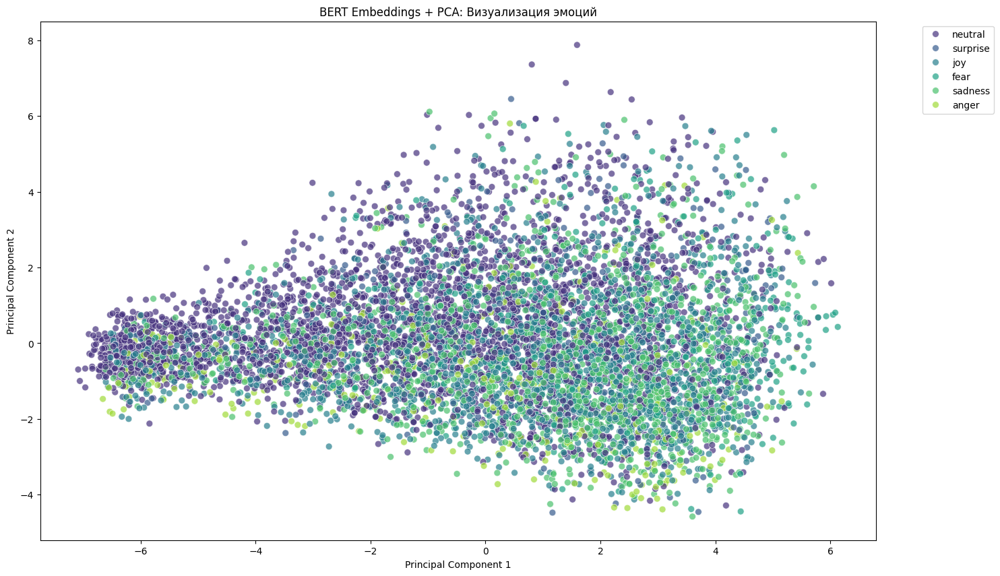

In [44]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Загрузка предобученной модели и токенизатора
model_name = 'sergeyzh/rubert-tiny-turbo'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# 2. Функция для получения BERT-эмбеддингов
def get_bert_embeddings(texts, batch_size=16):
    model.eval()
    embeddings = []
    
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        
        # Токенизация
        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        )
        
        # Получение эмбеддингов
        with torch.no_grad():
            outputs = model(**inputs)
        
        # Используем усредненные эмбеддинги последнего слоя
        batch_embeddings = outputs.last_hidden_state.mean(dim=1).cpu().numpy()
        embeddings.append(batch_embeddings)
    
    return np.vstack(embeddings)

# 3. Получение эмбеддингов для всего датасета
texts = df['text'].tolist()
embeddings = get_bert_embeddings(texts)

# 4. Уменьшение размерности с помощью PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(embeddings)
# 5. Подготовка данных для визуализации
df['pca1'] = pca_result[:, 0]
df['pca2'] = pca_result[:, 1]
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)

# 6. Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='pca1', 
    y='pca2',
    hue='dominant_emotion',
    palette='viridis',
    data=df,
    alpha=0.7,
    s=50
)

plt.title('BERT Embeddings + PCA: Визуализация эмоций')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_38356\2239107814.py:59: UserWarning: The palette list has more values (7) than needed (6), which may not be intended.
  sns.scatterplot(


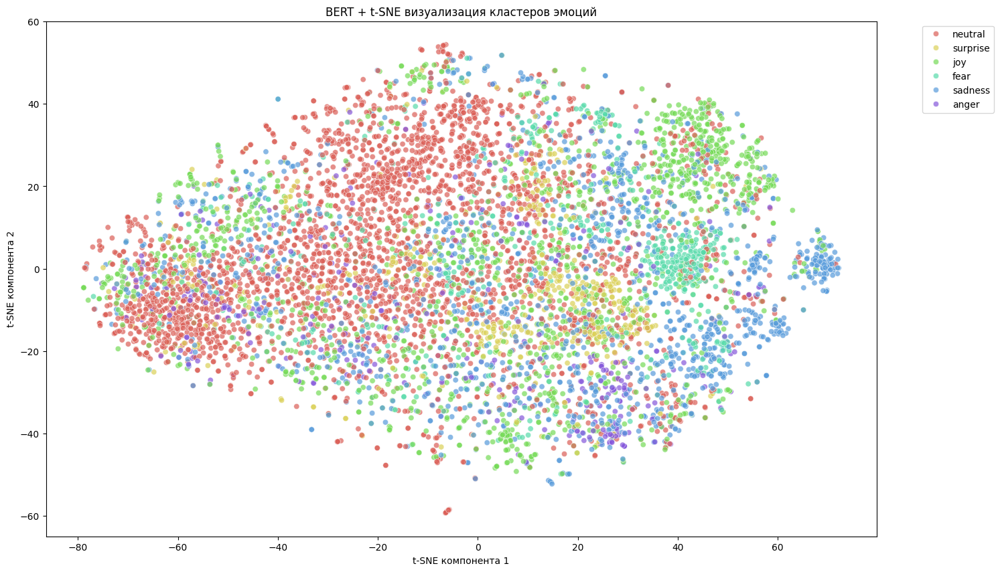

In [29]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Загрузка предобученной модели и токенизатора
model_name = 'sergeyzh/rubert-tiny-turbo'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# 2. Функция для получения BERT-эмбеддингов
def get_bert_embeddings(texts, batch_size=16):
    model.eval()
    embeddings = []
    
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        
        # Токенизация
        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        )
        
        # Получение эмбеддингов
        with torch.no_grad():
            outputs = model(**inputs)
        
        # Используем усредненные эмбеддинги последнего слоя
        batch_embeddings = outputs.last_hidden_state.mean(dim=1).cpu().numpy()
        embeddings.append(batch_embeddings)
    
    return np.vstack(embeddings)

# 3. Получение эмбеддингов для всего датасета
texts = df['text'].tolist()
embeddings = get_bert_embeddings(texts)

df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)


# # Уменьшение размерности с помощью PCA 
# pca = PCA(n_components=100, random_state=42)
# X_pca = pca.fit_transform(embeddings)
# Применение t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(embeddings)
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_tsne, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('BERT + t-SNE визуализация кластеров эмоций')
plt.xlabel('t-SNE компонента 1')
plt.ylabel('t-SNE компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# XED

In [3]:
df = pd.read_csv('xed.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17528 entries, 0 to 17527
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   text      17528 non-null  object
 1   anger     17528 non-null  int64 
 2   disgust   17528 non-null  int64 
 3   fear      17528 non-null  int64 
 4   joy       17528 non-null  int64 
 5   sadness   17528 non-null  int64 
 6   surprise  17528 non-null  int64 
 7   neutral   17528 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 1.1+ MB


In [7]:
df['text'] = df['text'].apply(cleaner)

In [8]:
df.sample(30)

,text,anger,disgust,fear,joy,sadness,surprise,neutral
10063,малышу придётся сыграть,1,0,1,0,0,0,0
16326,думаешь солдаты русские?,0,0,0,0,0,1,0
5508,хочешь дать один?,0,0,0,0,0,1,0
14200,недостаточно могущественна,0,0,0,0,1,0,0
15957,потрясающе,0,0,0,0,0,1,0
13726,порядке,0,0,0,1,0,0,0
12079,приближаются,0,0,1,0,0,0,0
571,убегай,1,0,0,0,1,0,0
13195,удовольствием,0,0,0,1,0,0,1
15167,уверена твоими родителями сложно,0,0,0,0,1,0,0


C:\Users\rvv19\AppData\Local\Temp\ipykernel_38356\3070234706.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")


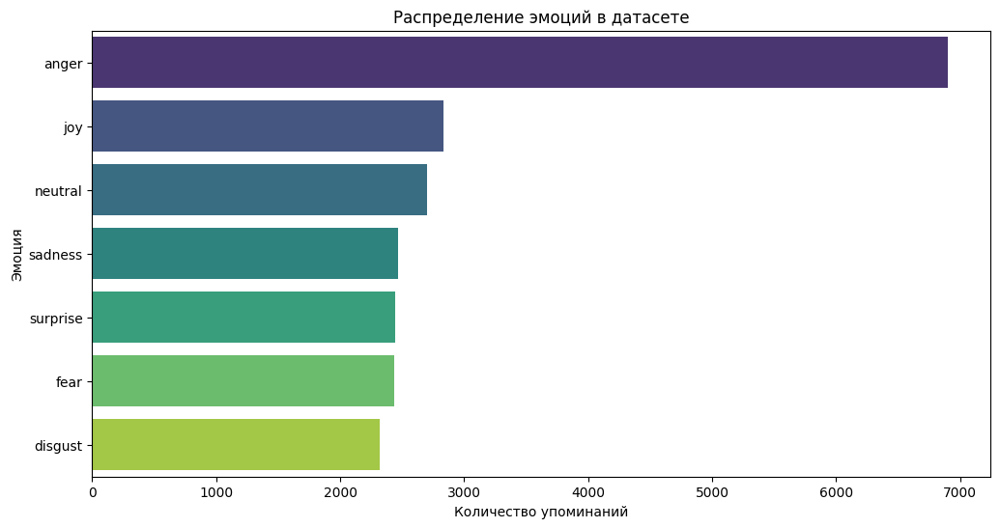

In [9]:
emotion_columns = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'neutral']
emotion_counts = df[emotion_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=emotion_counts.values, y=emotion_counts.index, palette="viridis")
plt.title("Распределение эмоций в датасете")
plt.xlabel("Количество упоминаний")
plt.ylabel("Эмоция")
plt.show()

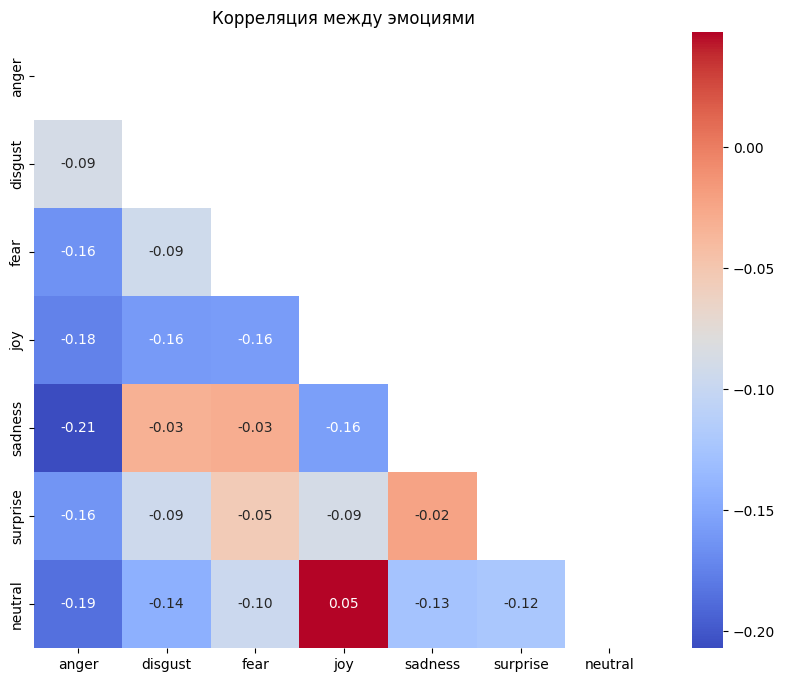

In [10]:

plt.figure(figsize=(10, 8))
corr_matrix = df[emotion_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Корреляция между эмоциями")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_38356\373759033.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='num_emotions', data=df, palette="rocket")


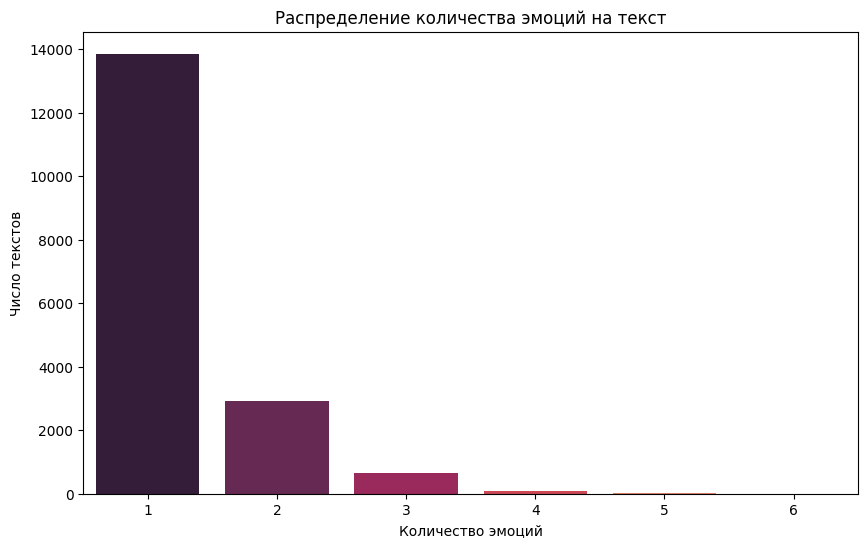

In [11]:
df['num_emotions'] = df[emotion_columns].sum(axis=1)
plt.figure(figsize=(10, 6))
sns.countplot(x='num_emotions', data=df, palette="rocket")
plt.title("Распределение количества эмоций на текст")
plt.xlabel("Количество эмоций")
plt.ylabel("Число текстов")
plt.show()

C:\Users\rvv19\AppData\Local\Temp\ipykernel_38356\3648161424.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


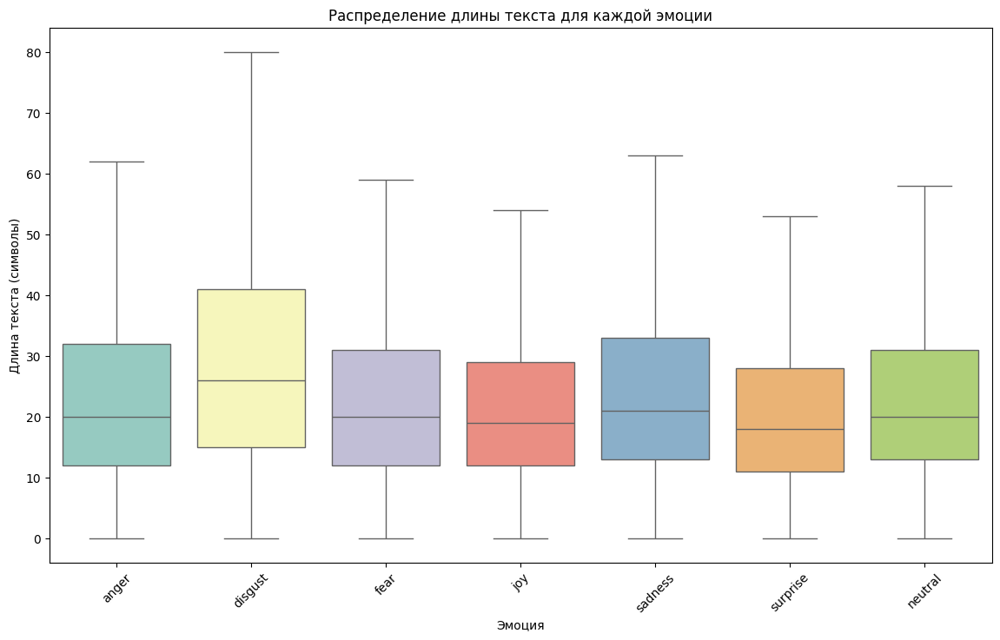

In [12]:
df['text_length'] = df['text'].apply(len)

# Преобразуем данные и фильтруем только случаи, где эмоция присутствует (is_present = 1)
melted_df = pd.melt(
    df, 
    id_vars=['text_length'], 
    value_vars=emotion_columns, 
    var_name='emotion', 
    value_name='is_present'
)

# Фильтрация строк с активными эмоциями (is_present == 1)
filtered_df = melted_df[melted_df['is_present'] == 1]

# Построение графика
plt.figure(figsize=(14, 8))
sns.boxplot(
    x='emotion', 
    y='text_length', 
    data=filtered_df, 
    palette="Set3", 
    showfliers=False  # Убираем выбросы для наглядности
)
plt.title("Распределение длины текста для каждой эмоции")
plt.xlabel("Эмоция")
plt.ylabel("Длина текста (символы)")
plt.xticks(rotation=45)
plt.show()

Общее количество слов: 60,857
Уникальные слова: 16,700
Топ-10 частых слов:
это: 2228
[персон]: 806
тебе: 637
очень: 355
хочу: 298
просто: 292
почему: 267
могу: 253
[person]: 228
должен: 226


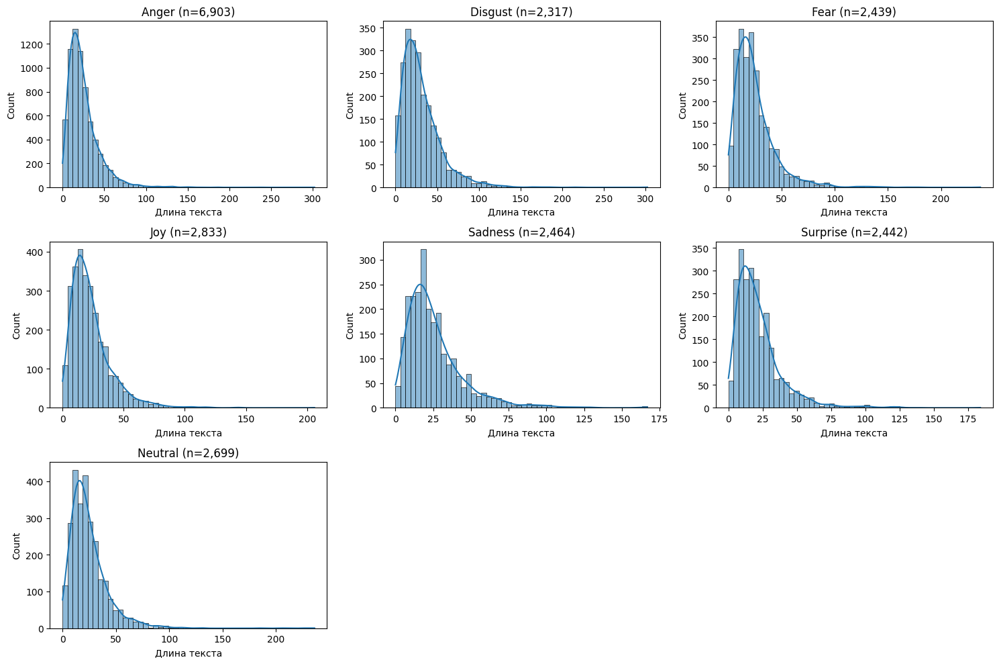

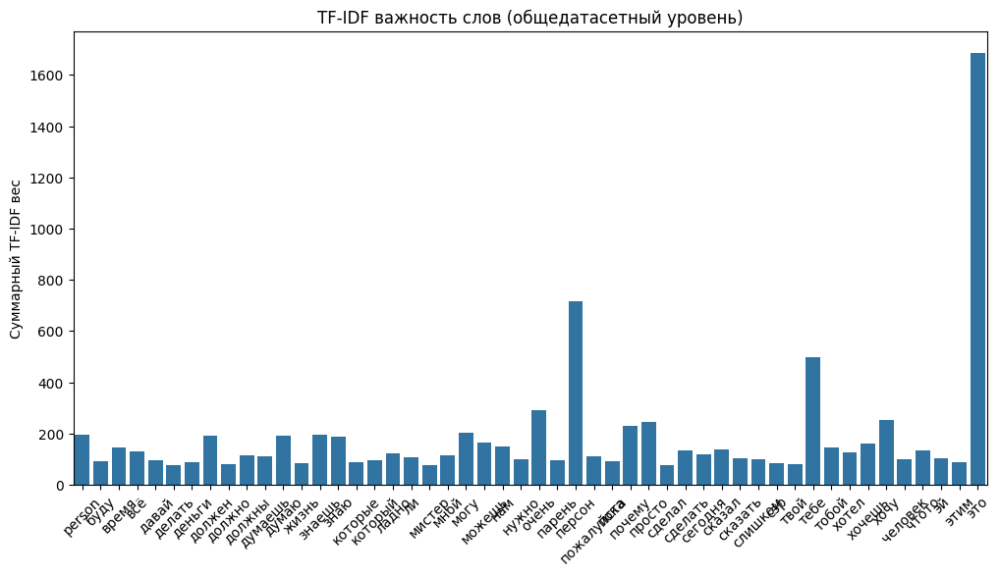

C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\3161085220.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\3161085220.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\3161085220.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, palette='viridis')
C:\Users\rvv19\AppData\Local\Temp\ipykernel_804980\3161085220.py:54: Futu

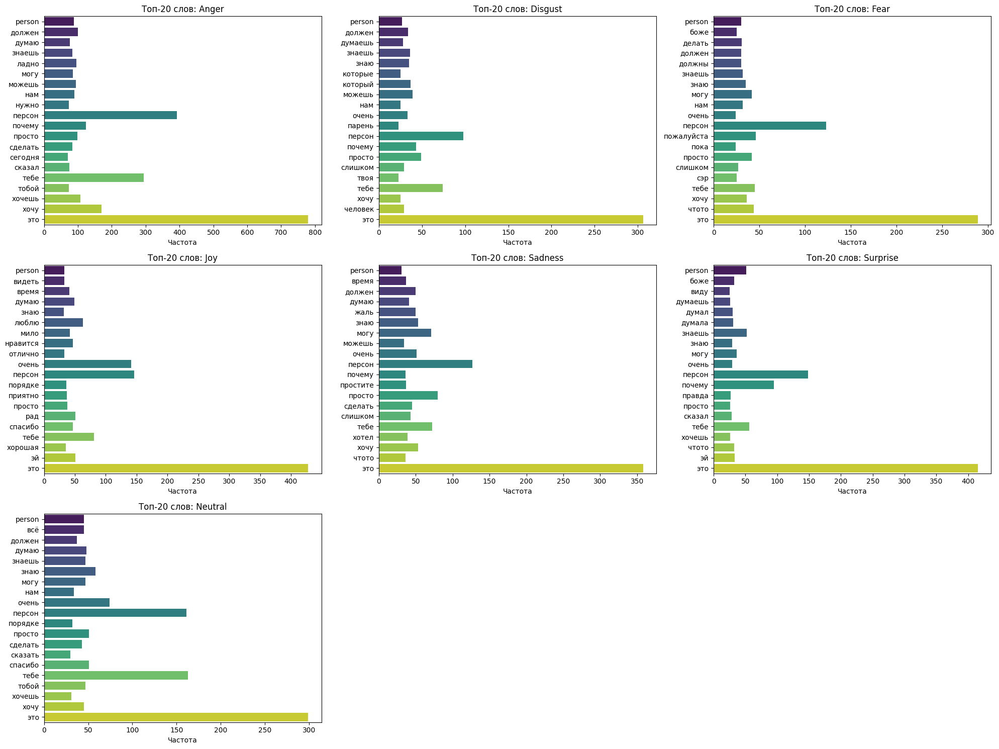


Количество уникальных слов по эмоциям:
anger: 4,763
disgust: 2,283
fear: 1,551
joy: 1,499
sadness: 1,504
surprise: 1,486
neutral: 1,478


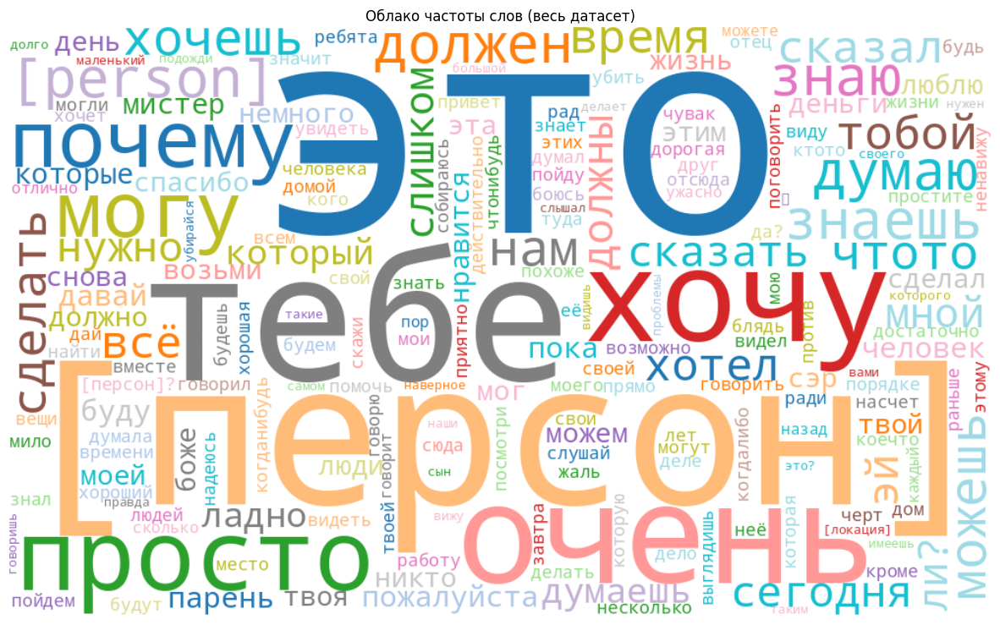

In [44]:
#Общая статистика
all_words = ' '.join(df['text']).split()
word_freq = Counter(all_words)

print(f"Общее количество слов: {len(all_words):,}")
print(f"Уникальные слова: {len(word_freq):,}")
print(f"Топ-10 частых слов:")
for word, freq in word_freq.most_common(10):
    print(f"{word}: {freq}")

#Анализ по эмоциям
plt.figure(figsize=(15, 10))

#Распределение длины текстов
for i, emotion in enumerate(EMOTIONS, 1):
    subset = df[df[emotion] == 1]
    plt.subplot(3, 3, i)
    sns.histplot(subset['text'].apply(len), bins=50, kde=True)
    plt.title(f'{emotion.capitalize()} (n={len(subset):,})')
    plt.xlabel('Длина текста')

plt.tight_layout()
plt.show()

# 4. TF-IDF анализ для уникальных слов
tfidf = TfidfVectorizer(max_features=50)
tfidf_matrix = tfidf.fit_transform(df['text'])
feature_names = tfidf.get_feature_names_out()

# Визуализация TF-IDF
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_names, y=tfidf_matrix.sum(axis=0).A1)
plt.xticks(rotation=45)
plt.title('TF-IDF важность слов (общедатасетный уровень)')
plt.ylabel('Суммарный TF-IDF вес')
plt.show()

#Уникальные слова для каждой эмоции
plt.figure(figsize=(20, 15))

for idx, emotion in enumerate(EMOTIONS, 1):
    # Фильтрация текстов для эмоции
    emotion_texts = df[df[emotion] == 1]['text']
    if len(emotion_texts)==0:
        continue
    # Расчет частоты слов
    vectorizer = CountVectorizer(max_features=20)
    matrix = vectorizer.fit_transform(emotion_texts)
    words = vectorizer.get_feature_names_out()
    frequencies = matrix.sum(axis=0).A1
    
    # Визуализация
    plt.subplot(3, 3, idx)
    sns.barplot(x=frequencies, y=words, palette='viridis')
    plt.title(f'Топ-20 слов: {emotion.capitalize()}')
    plt.xlabel('Частота')

plt.tight_layout()
plt.show()

# Матрица уникальности слов
unique_words = {}
for emotion in EMOTIONS:
    emotion_words = set(' '.join(df[df[emotion] == 1]['text']).split())
    other_words = set(' '.join(df[df[emotion] == 0]['text']).split())
    unique_words[emotion] = emotion_words - other_words

print("\nКоличество уникальных слов по эмоциям:")
for emotion, words in unique_words.items():
    print(f"{emotion}: {len(words):,}")

#Word Frequency Cloud
plt.figure(figsize=(15, 10))
wc = WordCloud(width=1000, height=600, background_color='white', colormap='tab20')
wc.generate_from_frequencies(word_freq)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Облако частоты слов (весь датасет)')
plt.show()

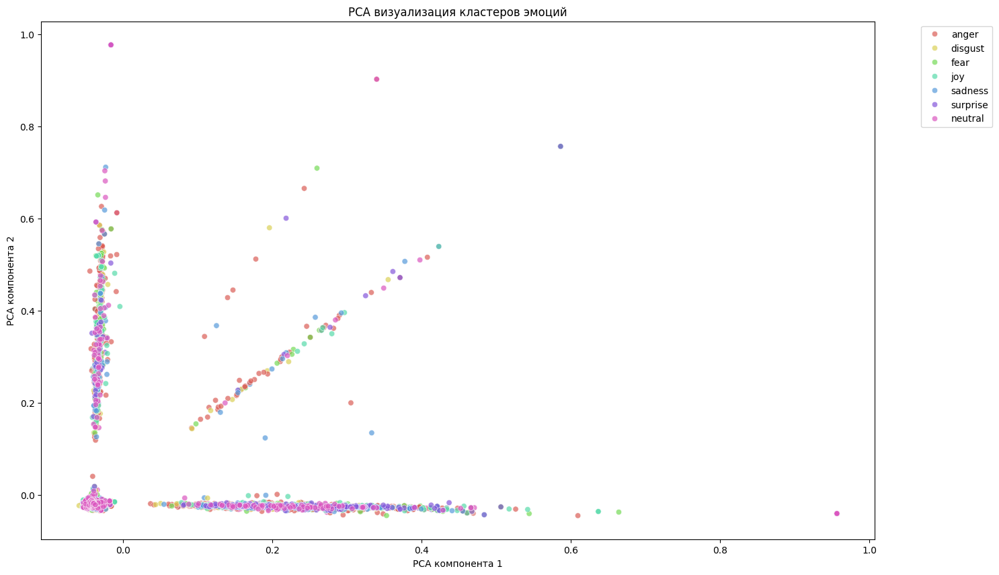

In [13]:
# Выберем доминирующую эмоцию для каждого текста
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)
# Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(df['text'])
# Уменьшение размерности с помощью PCA 
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X.toarray())
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_pca, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('PCA визуализация кластеров эмоций')
plt.xlabel('PCA компонента 1')
plt.ylabel('PCA компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

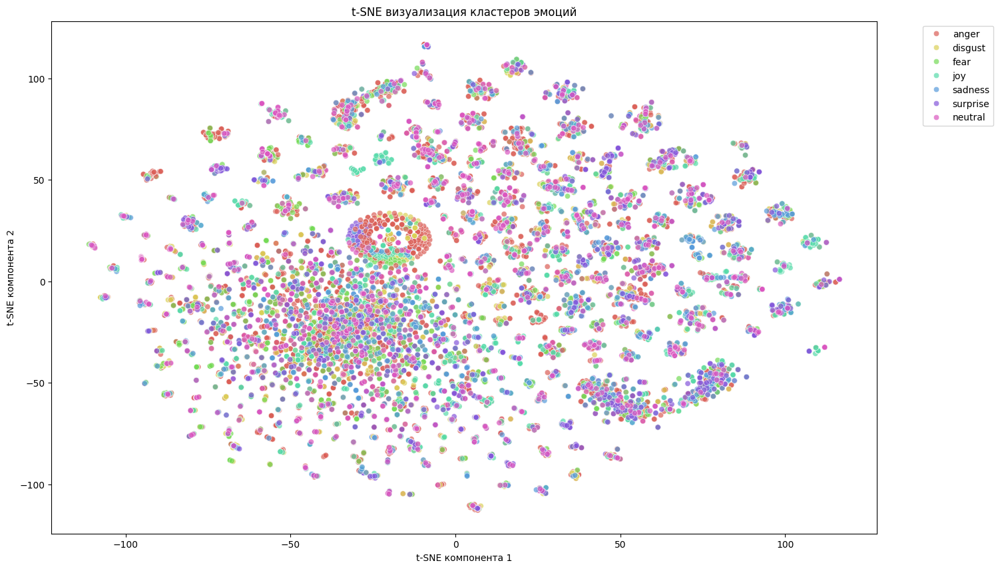

In [17]:
# Выберем доминирующую эмоцию для каждого текста
df['dominant_emotion'] = df[emotion_columns].idxmax(axis=1)
# Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(df['text'])
# Уменьшение размерности с помощью PCA 
pca = PCA(n_components=100, random_state=42)
X_pca = pca.fit_transform(X.toarray())
# Применение t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(X_pca)
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_tsne, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('t-SNE визуализация кластеров эмоций')
plt.xlabel('t-SNE компонента 1')
plt.ylabel('t-SNE компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

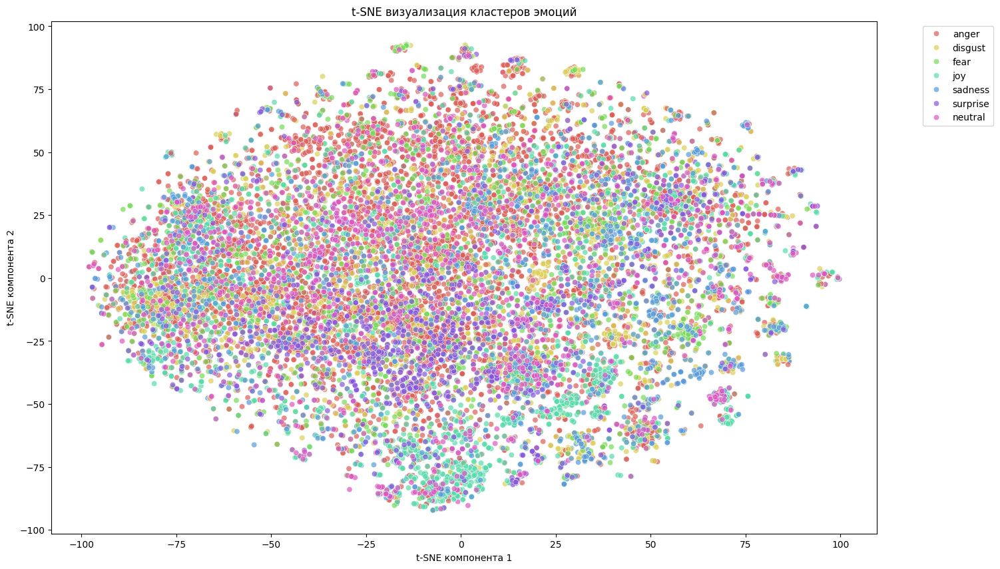

In [19]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Загрузка предобученной модели и токенизатора
model_name = 'sergeyzh/rubert-tiny-turbo'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# 2. Функция для получения BERT-эмбеддингов
def get_bert_embeddings(texts, batch_size=16):
    model.eval()
    embeddings = []
    
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        
        # Токенизация
        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        )
        
        # Получение эмбеддингов
        with torch.no_grad():
            outputs = model(**inputs)
        
        # Используем усредненные эмбеддинги последнего слоя
        batch_embeddings = outputs.last_hidden_state.mean(dim=1).cpu().numpy()
        embeddings.append(batch_embeddings)
    
    return np.vstack(embeddings)

# 3. Получение эмбеддингов для всего датасета
texts = df['text'].tolist()
embeddings = get_bert_embeddings(texts)




# # Уменьшение размерности с помощью PCA 
# pca = PCA(n_components=100, random_state=42)
# X_pca = pca.fit_transform(embeddings)
# Применение t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(embeddings)
# Создание DataFrame для визуализации
tsne_df = pd.DataFrame(X_tsne, columns=['x', 'y'])
tsne_df['emotion'] = df['dominant_emotion']

# Визуализация
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='emotion',
    palette=sns.color_palette('hls', len(emotion_columns)),
    data=tsne_df,
    legend='full',
    alpha=0.7
)

plt.title('t-SNE визуализация кластеров эмоций')
plt.xlabel('t-SNE компонента 1')
plt.ylabel('t-SNE компонента 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



# сравнение датасетов


## CEDR - ИМБП РАН

In [19]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что в каждом файле есть колонки "text" и "emotion")
dataset1 = pd.read_csv("CEDR.csv")
dataset2 = pd.read_csv('eskis_trans.csv')
dataset2= dataset2.dropna()
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1 и 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)  # перемешиваем данные

# Преобразование текста в признаки с использованием TF-IDF
vectorizer = TfidfVectorizer(max_features=10000, stop_words='english')
X_combined = vectorizer.fit_transform(combined_df['text'])
y_combined = combined_df['source']

# Разбиваем на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)

# Обучаем классификатор (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Binary Classification Report ===")
print(classification_report(y_test, y_pred))
# Если точность близка к 50%, модели не удается отличить источник, что указывает на схожесть датасетов.

#####################################################
# 2. Кросс-доменальная классификация для эмоций
#####################################################

# a) Обучение на dataset1, тестирование на dataset2
vectorizer_emotion = TfidfVectorizer(max_features=10000)
X_train_emotion = vectorizer_emotion.fit_transform(dataset1['text'])
X_test_emotion = vectorizer_emotion.transform(dataset2['text'])
y_train_emotion = dataset1['emotion']
y_test_emotion = dataset2['emotion']

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Cross-Domain Emotion Classification Report ===")
print("Train on CEDR, Test on ESKIS:")
print(classification_report(y_test_emotion, y_pred_emotion))

# # b) При желании можно провести обратный эксперимент: обучение на dataset2, тестирование на dataset1
# vectorizer_emotion_2 = TfidfVectorizer(max_features=10000)
# X_train_emotion_2 = vectorizer_emotion_2.fit_transform(dataset2['text'])
# X_test_emotion_2 = vectorizer_emotion_2.transform(dataset1['text'])
# y_train_emotion_2 = dataset2['emotion']
# y_test_emotion_2 = dataset1['emotion']

# clf_emotion_2 = LogisticRegression(max_iter=1000)
# clf_emotion_2.fit(X_train_emotion_2, y_train_emotion_2)
# y_pred_emotion_2 = clf_emotion_2.predict(X_test_emotion_2)

# print("\nTrain on dataset2, Test on CEDR:")
# print(classification_report(y_test_emotion_2, y_pred_emotion_2))


=== Binary Classification Report ===
              precision    recall  f1-score   support

           0       0.89      0.99      0.94      2249
           1       0.98      0.65      0.78       787

    accuracy                           0.90      3036
   macro avg       0.93      0.82      0.86      3036
weighted avg       0.91      0.90      0.90      3036


=== Cross-Domain Emotion Classification Report ===
Train on CEDR, Test on ESKIS:
              precision    recall  f1-score   support

       anger       0.00      0.00      0.00        45
     disgust       0.00      0.00      0.00       306
        fear       0.00      0.00      0.00        12
         joy       0.09      0.53      0.16       176
     neutral       0.65      0.52      0.58      1645
     sadness       0.04      0.10      0.06       116
    surprise       0.17      0.00      0.01       291

    accuracy                           0.37      2591
   macro avg       0.14      0.17      0.12      2591
weighted avg

c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

## XED - ESKIS

In [20]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что в каждом файле есть колонки "text" и "emotion")
dataset1 = pd.read_csv("XED.csv")
dataset2 = pd.read_csv('eskis_trans.csv')
dataset2= dataset2.dropna()
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1 и 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)  # перемешиваем данные

# Преобразование текста в признаки с использованием TF-IDF
vectorizer = TfidfVectorizer(max_features=10000, stop_words='english')
X_combined = vectorizer.fit_transform(combined_df['text'])
y_combined = combined_df['source']

# Разбиваем на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)

# Обучаем классификатор (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Binary Classification Report ===")
print(classification_report(y_test, y_pred))
# Если точность близка к 50%, модели не удается отличить источник, что указывает на схожесть датасетов.

#####################################################
# 2. Кросс-доменальная классификация для эмоций
#####################################################

# a) Обучение на dataset1, тестирование на dataset2
vectorizer_emotion = TfidfVectorizer(max_features=10000)
X_train_emotion = vectorizer_emotion.fit_transform(dataset1['text'])
X_test_emotion = vectorizer_emotion.transform(dataset2['text'])
y_train_emotion = dataset1['emotion']
y_test_emotion = dataset2['emotion']

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Cross-Domain Emotion Classification Report ===")
print("Train on XED, Test on ESKIS:")
print(classification_report(y_test_emotion, y_pred_emotion))

# # b) При желании можно провести обратный эксперимент: обучение на dataset2, тестирование на dataset1
# vectorizer_emotion_2 = TfidfVectorizer(max_features=10000)
# X_train_emotion_2 = vectorizer_emotion_2.fit_transform(dataset2['text'])
# X_test_emotion_2 = vectorizer_emotion_2.transform(dataset1['text'])
# y_train_emotion_2 = dataset2['emotion']
# y_test_emotion_2 = dataset1['emotion']

# clf_emotion_2 = LogisticRegression(max_iter=1000)
# clf_emotion_2.fit(X_train_emotion_2, y_train_emotion_2)
# y_pred_emotion_2 = clf_emotion_2.predict(X_test_emotion_2)

# print("\nTrain on dataset2, Test on dataset1:")
# print(classification_report(y_test_emotion_2, y_pred_emotion_2))

=== Binary Classification Report ===
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      5292
           1       0.98      0.59      0.74       744

    accuracy                           0.95      6036
   macro avg       0.96      0.79      0.85      6036
weighted avg       0.95      0.95      0.94      6036


=== Cross-Domain Emotion Classification Report ===
Train on XED, Test on ESKIS:
              precision    recall  f1-score   support

       anger       0.02      0.87      0.04        45
     disgust       0.10      0.01      0.01       306
        fear       0.00      0.00      0.00        12
         joy       0.09      0.20      0.12       176
     neutral       0.63      0.01      0.03      1645
     sadness       0.04      0.03      0.04       116
    surprise       0.33      0.01      0.01       291

    accuracy                           0.04      2591
   macro avg       0.17      0.16      0.04      2591
weighted avg 

# goEMO - ESKIS

In [15]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что в каждом файле есть колонки "text" и "emotion")
dataset1 = pd.read_csv("goemo.csv")
dataset2 = pd.read_csv('eskis_trans.csv')
dataset2= dataset2.dropna()
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1 и 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)  # перемешиваем данные

# Преобразование текста в признаки с использованием TF-IDF
vectorizer = TfidfVectorizer(max_features=10000, stop_words='english')
X_combined = vectorizer.fit_transform(combined_df['text'])
y_combined = combined_df['source']

# Разбиваем на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)

# Обучаем классификатор (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Binary Classification Report ===")
print(classification_report(y_test, y_pred))
# Если точность близка к 50%, модели не удается отличить источник, что указывает на схожесть датасетов.

#####################################################
# 2. Кросс-доменальная классификация для эмоций
#####################################################

# a) Обучение на dataset1, тестирование на dataset2
vectorizer_emotion = TfidfVectorizer(max_features=10000)
X_train_emotion = vectorizer_emotion.fit_transform(dataset1['text'])
X_test_emotion = vectorizer_emotion.transform(dataset2['text'])
y_train_emotion = dataset1['emotion']
y_test_emotion = dataset2['emotion']

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Cross-Domain Emotion Classification Report ===")
print("Train on goEMO, Test on ESKIS:")
print(classification_report(y_test_emotion, y_pred_emotion))

# # b) При желании можно провести обратный эксперимент: обучение на dataset2, тестирование на dataset1
# vectorizer_emotion_2 = TfidfVectorizer(max_features=10000)
# X_train_emotion_2 = vectorizer_emotion_2.fit_transform(dataset2['text'])
# X_test_emotion_2 = vectorizer_emotion_2.transform(dataset1['text'])
# y_train_emotion_2 = dataset2['emotion']
# y_test_emotion_2 = dataset1['emotion']

# clf_emotion_2 = LogisticRegression(max_iter=1000)
# clf_emotion_2.fit(X_train_emotion_2, y_train_emotion_2)
# y_pred_emotion_2 = clf_emotion_2.predict(X_test_emotion_2)

# print("\nTrain on dataset2, Test on dataset1:")
# print(classification_report(y_test_emotion_2, y_pred_emotion_2))

=== Binary Classification Report ===
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     63380
           1       0.97      0.39      0.56       765

    accuracy                           0.99     64145
   macro avg       0.98      0.70      0.78     64145
weighted avg       0.99      0.99      0.99     64145


=== Cross-Domain Emotion Classification Report ===
Train on goEMO, Test on ESKIS:
              precision    recall  f1-score   support

       anger       0.05      0.07      0.06        45
     disgust       0.00      0.00      0.00       306
        fear       0.00      0.00      0.00        12
         joy       0.09      0.59      0.16       176
     neutral       0.66      0.53      0.59      1645
     sadness       0.08      0.01      0.02       116
    surprise       0.07      0.01      0.02       291

    accuracy                           0.38      2591
   macro avg       0.14      0.17      0.12      2591
weighted av

c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

## CEDR - XED

In [6]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что в каждом файле есть колонки "text" и "emotion")
dataset1 = pd.read_csv("CEDR.csv")
dataset2 = pd.read_csv("XED.csv")
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1 и 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)  # перемешиваем данные

# Преобразование текста в признаки с использованием TF-IDF
vectorizer = TfidfVectorizer(max_features=10000, stop_words='english')
X_combined = vectorizer.fit_transform(combined_df['text'])
y_combined = combined_df['source']

# Разбиваем на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)

# Обучаем классификатор (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Binary Classification Report ===")
print(classification_report(y_test, y_pred))
# Если точность близка к 50%, модели не удается отличить источник, что указывает на схожесть датасетов.

#####################################################
# 2. Кросс-доменальная классификация для эмоций
#####################################################

# a) Обучение на dataset1, тестирование на dataset2
vectorizer_emotion = TfidfVectorizer(max_features=10000)
X_train_emotion = vectorizer_emotion.fit_transform(dataset1['text'])
X_test_emotion = vectorizer_emotion.transform(dataset2['text'])
y_train_emotion = dataset1['emotion']
y_test_emotion = dataset2['emotion']

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Cross-Domain Emotion Classification Report ===")
print("Train on dataset1, Test on dataset2:")
print(classification_report(y_test_emotion, y_pred_emotion))

# b) При желании можно провести обратный эксперимент: обучение на dataset2, тестирование на dataset1
vectorizer_emotion_2 = TfidfVectorizer(max_features=10000)
X_train_emotion_2 = vectorizer_emotion_2.fit_transform(dataset2['text'])
X_test_emotion_2 = vectorizer_emotion_2.transform(dataset1['text'])
y_train_emotion_2 = dataset2['emotion']
y_test_emotion_2 = dataset1['emotion']

clf_emotion_2 = LogisticRegression(max_iter=1000)
clf_emotion_2.fit(X_train_emotion_2, y_train_emotion_2)
y_pred_emotion_2 = clf_emotion_2.predict(X_test_emotion_2)

print("\nTrain on dataset2, Test on dataset1:")
print(classification_report(y_test_emotion_2, y_pred_emotion_2))

# Интерпретация:
# - Если модель для бинарной классификации показывает точность около 50%, это говорит о том,
#   что датасеты сложно отличить по текстовым характеристикам.
# - Если кросс-доменальная классификация эмоций даёт схожие результаты с внутренней валидацией,
#   можно предположить, что распределения эмоций и лингвистические особенности текстов схожи.


=== Binary Classification Report ===
              precision    recall  f1-score   support

           0       0.90      0.67      0.77      2271
           1       0.87      0.97      0.92      5246

    accuracy                           0.88      7517
   macro avg       0.88      0.82      0.84      7517
weighted avg       0.88      0.88      0.87      7517


=== Cross-Domain Emotion Classification Report ===
Train on dataset1, Test on dataset2:
              precision    recall  f1-score   support

       anger       0.48      0.00      0.01      6903
     disgust       0.00      0.00      0.00      1660
        fear       0.37      0.02      0.04      1904
         joy       0.19      0.50      0.27      2241
     neutral       0.09      0.50      0.15      1617
     sadness       0.19      0.25      0.22      1745
    surprise       0.33      0.03      0.05      1458

    accuracy                           0.14     17528
   macro avg       0.24      0.19      0.11     17528
weigh

c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo


Train on dataset2, Test on dataset1:
              precision    recall  f1-score   support

       anger       0.05      0.76      0.10       411
     disgust       0.00      0.00      0.00         0
        fear       0.44      0.25      0.32       585
         joy       0.58      0.20      0.29      1551
     neutral       0.31      0.00      0.01      3043
     sadness       0.43      0.17      0.24      1370
    surprise       0.46      0.08      0.13       568

    accuracy                           0.14      7528
   macro avg       0.33      0.21      0.16      7528
weighted avg       0.40      0.14      0.15      7528



c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

In [21]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что файлы 'dataset1.csv' и 'dataset2.csv'
# содержат колонки "text" и "emotion")
dataset1 = pd.read_csv("XED.csv")
dataset2 = pd.read_csv("CEDR.csv")
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
# Инициализация модели для получения эмбеддингов BERT.
# Здесь используется легкая модель для ускорения вычислений.
model = SentenceTransformer('sergeyzh/rubert-tiny-turbo')

#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1, 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты и перемешиваем записи
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Вычисляем эмбеддинги для всех текстов
texts_combined = combined_df['text'].tolist()
embeddings_combined = model.encode(texts_combined, show_progress_bar=True)

# Подготовка признаков и меток
X = embeddings_combined
y = combined_df['source'].values

# Разбивка на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Обучение классификатора (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Отчет по бинарной классификации источников (BERT эмбеддинги) ===")
print(classification_report(y_test, y_pred))


#############################################
# 2. Кросс-доменальная классификация эмоций
#############################################

# Вычисляем эмбеддинги для каждого датасета отдельно
texts1 = dataset1['text'].tolist()
texts2 = dataset2['text'].tolist()

embeddings1 = model.encode(texts1, show_progress_bar=True)
embeddings2 = model.encode(texts2, show_progress_bar=True)

# a) Обучение на dataset1, тестирование на dataset2
X_train_emotion = embeddings1
y_train_emotion = dataset1['emotion'].values

X_test_emotion = embeddings2
y_test_emotion = dataset2['emotion'].values

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Кросс-доменальная классификация эмоций (Обучение: dataset1, Тестирование: dataset2) ===")
print(classification_report(y_test_emotion, y_pred_emotion))

# b) Обратный эксперимент: обучение на dataset2, тестирование на dataset1
clf_emotion_2 = LogisticRegression(max_iter=1000)
clf_emotion_2.fit(embeddings2, dataset2['emotion'].values)
y_pred_emotion_2 = clf_emotion_2.predict(embeddings1)

print("\n=== Кросс-доменальная классификация эмоций (Обучение: dataset2, Тестирование: dataset1) ===")
print(classification_report(dataset1['emotion'].values, y_pred_emotion_2))

Batches:   0%|          | 0/783 [00:00<?, ?it/s]

=== Отчет по бинарной классификации источников (BERT эмбеддинги) ===
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      5222
           1       0.93      0.88      0.90      2295

    accuracy                           0.94      7517
   macro avg       0.94      0.93      0.93      7517
weighted avg       0.94      0.94      0.94      7517



Batches:   0%|          | 0/548 [00:00<?, ?it/s]

Batches:   0%|          | 0/236 [00:00<?, ?it/s]


=== Кросс-доменальная классификация эмоций (Обучение: dataset1, Тестирование: dataset2) ===
              precision    recall  f1-score   support

       anger       0.06      0.52      0.11       411
     disgust       0.00      0.00      0.00         0
        fear       0.38      0.58      0.46       585
         joy       0.67      0.40      0.50      1551
     neutral       0.82      0.01      0.02      3043
     sadness       0.58      0.38      0.46      1370
    surprise       0.58      0.25      0.35       568

    accuracy                           0.25      7528
   macro avg       0.44      0.31      0.27      7528
weighted avg       0.65      0.25      0.26      7528



c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita


=== Кросс-доменальная классификация эмоций (Обучение: dataset2, Тестирование: dataset1) ===
              precision    recall  f1-score   support

       anger       0.54      0.04      0.07      6903
     disgust       0.00      0.00      0.00      1660
        fear       0.46      0.09      0.15      1904
         joy       0.40      0.53      0.45      2241
     neutral       0.11      0.75      0.19      1617
     sadness       0.31      0.42      0.36      1745
    surprise       0.33      0.13      0.18      1458

    accuracy                           0.21     17528
   macro avg       0.31      0.28      0.20     17528
weighted avg       0.38      0.21      0.17     17528



c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Вывод
Бинарная классификация источников показывает, что датасеты достаточно различимы.   
Высокая точность (88 %) означает, что тексты из двух источников имеют отличительные признаки, позволяющие модели их различать.   
Кросс-доменальная классификация эмоций демонстрирует крайне низкую переносимость моделей.    
Это свидетельствует о том, что распределение эмоций, стиль текстов или методы аннотации существенно различаются между датасетами.   
Таким образом, объединение этих датасетов без учета доменных различий может привести к ухудшению качества моделей. 

## goEMO-CEDR

In [8]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что в каждом файле есть колонки "text" и "emotion")
dataset1 = pd.read_csv("goemo.csv")
dataset2 = pd.read_csv("CEDR.csv")
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1 и 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)  # перемешиваем данные

# Преобразование текста в признаки с использованием TF-IDF
vectorizer = TfidfVectorizer(max_features=10000, stop_words='english')
X_combined = vectorizer.fit_transform(combined_df['text'])
y_combined = combined_df['source']

# Разбиваем на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)

# Обучаем классификатор (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Binary Classification Report ===")
print(classification_report(y_test, y_pred))
# Если точность близка к 50%, модели не удается отличить источник, что указывает на схожесть датасетов.

#####################################################
# 2. Кросс-доменальная классификация для эмоций
#####################################################

# a) Обучение на dataset1, тестирование на dataset2
vectorizer_emotion = TfidfVectorizer(max_features=10000)
X_train_emotion = vectorizer_emotion.fit_transform(dataset1['text'])
X_test_emotion = vectorizer_emotion.transform(dataset2['text'])
y_train_emotion = dataset1['emotion']
y_test_emotion = dataset2['emotion']

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Cross-Domain Emotion Classification Report ===")
print("Train on dataset1, Test on dataset2:")
print(classification_report(y_test_emotion, y_pred_emotion))

# b) При желании можно провести обратный эксперимент: обучение на dataset2, тестирование на dataset1
vectorizer_emotion_2 = TfidfVectorizer(max_features=10000)
X_train_emotion_2 = vectorizer_emotion_2.fit_transform(dataset2['text'])
X_test_emotion_2 = vectorizer_emotion_2.transform(dataset1['text'])
y_train_emotion_2 = dataset2['emotion']
y_test_emotion_2 = dataset1['emotion']

clf_emotion_2 = LogisticRegression(max_iter=1000)
clf_emotion_2.fit(X_train_emotion_2, y_train_emotion_2)
y_pred_emotion_2 = clf_emotion_2.predict(X_test_emotion_2)

print("\nTrain on dataset2, Test on dataset1:")
print(classification_report(y_test_emotion_2, y_pred_emotion_2))

=== Binary Classification Report ===
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     63401
           1       0.91      0.23      0.36      2225

    accuracy                           0.97     65626
   macro avg       0.94      0.61      0.67     65626
weighted avg       0.97      0.97      0.97     65626


=== Cross-Domain Emotion Classification Report ===
Train on dataset1, Test on dataset2:
              precision    recall  f1-score   support

       anger       0.14      0.28      0.19       411
     disgust       0.00      0.00      0.00         0
        fear       0.69      0.41      0.51       585
         joy       0.42      0.56      0.48      1551
     neutral       0.56      0.70      0.62      3043
     sadness       0.80      0.16      0.26      1370
    surprise       0.28      0.10      0.15       568

    accuracy                           0.48      7528
   macro avg       0.41      0.32      0.32      7528
weigh

c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita


Train on dataset2, Test on dataset1:


c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

       anger       0.50      0.00      0.01     33884
     disgust       0.00      0.00      0.00      3958
        fear       0.44      0.09      0.16      4129
         joy       0.56      0.44      0.49     79352
     neutral       0.32      0.69      0.44     55298
     sadness       0.15      0.27      0.19     13964
    surprise       0.26      0.03      0.05     20640

    accuracy                           0.37    211225
   macro avg       0.32      0.22      0.19    211225
weighted avg       0.42      0.37      0.32    211225



c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


вывод
Бинарная классификация источников:

Модель показывает высокую общую точность (97 %), что указывает на наличие отчетливых различительных признаков между датасетами.    
Однако низкий Recall для менее представленного класса (0.23 для класса 1) указывает на то, что при различении источников некоторые группы остаются слабо представлены.  
Кросс-доменальная классификация эмоций:   

Обе конфигурации (обучение на одном датасете и тестирование на другом) показывают низкую точность (48 % и 37 %), что подтверждает сильный доменный сдвиг.    
Модель, обученная на одном наборе данных, практически не способна корректно классифицировать эмоции в другом, что указывает на различия    
в распределении эмоций, стилистике текстов или аннотационных правилах между датасетами.    

## goEmotion - XED

In [7]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что в каждом файле есть колонки "text" и "emotion")
dataset1 = pd.read_csv("goemo.csv")
dataset2 = pd.read_csv("XED.csv")
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1 и 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)  # перемешиваем данные

# Преобразование текста в признаки с использованием TF-IDF
vectorizer = TfidfVectorizer(max_features=10000, stop_words='english')
X_combined = vectorizer.fit_transform(combined_df['text'])
y_combined = combined_df['source']

# Разбиваем на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)

# Обучаем классификатор (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Binary Classification Report ===")
print(classification_report(y_test, y_pred))
# Если точность близка к 50%, модели не удается отличить источник, что указывает на схожесть датасетов.

#####################################################
# 2. Кросс-доменальная классификация для эмоций
#####################################################

# a) Обучение на dataset1, тестирование на dataset2
vectorizer_emotion = TfidfVectorizer(max_features=10000)
X_train_emotion = vectorizer_emotion.fit_transform(dataset1['text'])
X_test_emotion = vectorizer_emotion.transform(dataset2['text'])
y_train_emotion = dataset1['emotion']
y_test_emotion = dataset2['emotion']

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Cross-Domain Emotion Classification Report ===")
print("Train on dataset1, Test on dataset2:")
print(classification_report(y_test_emotion, y_pred_emotion))

# b) При желании можно провести обратный эксперимент: обучение на dataset2, тестирование на dataset1
vectorizer_emotion_2 = TfidfVectorizer(max_features=10000)
X_train_emotion_2 = vectorizer_emotion_2.fit_transform(dataset2['text'])
X_test_emotion_2 = vectorizer_emotion_2.transform(dataset1['text'])
y_train_emotion_2 = dataset2['emotion']
y_test_emotion_2 = dataset1['emotion']

clf_emotion_2 = LogisticRegression(max_iter=1000)
clf_emotion_2.fit(X_train_emotion_2, y_train_emotion_2)
y_pred_emotion_2 = clf_emotion_2.predict(X_test_emotion_2)

print("\nTrain on dataset2, Test on dataset1:")
print(classification_report(y_test_emotion_2, y_pred_emotion_2))

=== Binary Classification Report ===
              precision    recall  f1-score   support

           0       0.94      1.00      0.97     63348
           1       0.83      0.23      0.36      5278

    accuracy                           0.94     68626
   macro avg       0.88      0.61      0.66     68626
weighted avg       0.93      0.94      0.92     68626


=== Cross-Domain Emotion Classification Report ===
Train on dataset1, Test on dataset2:
              precision    recall  f1-score   support

       anger       0.49      0.15      0.23      6903
     disgust       0.56      0.01      0.02      1660
        fear       0.48      0.04      0.08      1904
         joy       0.27      0.64      0.38      2241
     neutral       0.09      0.49      0.15      1617
     sadness       0.59      0.11      0.18      1745
    surprise       0.24      0.17      0.20      1458

    accuracy                           0.21     17528
   macro avg       0.39      0.23      0.18     17528
weigh

In [16]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Загрузка датасетов (предполагается, что файлы 'dataset1.csv' и 'dataset2.csv'
# содержат колонки "text" и "emotion")
dataset1 = pd.read_csv("XED.csv")
dataset2 = pd.read_csv("goemo.csv")
dataset1['emotion'] = dataset1[EMOTIONS].idxmax(axis=1)
dataset2['emotion'] = dataset2[EMOTIONS].idxmax(axis=1)
# Инициализация модели для получения эмбеддингов BERT.
# Здесь используется легкая модель для ускорения вычислений.
model = SentenceTransformer('sergeyzh/rubert-tiny-turbo')

#############################################
# 1. Бинарная классификация источников данных
#############################################

# Добавляем метку источника: 0 для dataset1, 1 для dataset2
dataset1['source'] = 0
dataset2['source'] = 1

# Объединяем датасеты и перемешиваем записи
combined_df = pd.concat([dataset1, dataset2], ignore_index=True)
combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Вычисляем эмбеддинги для всех текстов
texts_combined = combined_df['text'].tolist()
embeddings_combined = model.encode(texts_combined, show_progress_bar=True)

# Подготовка признаков и меток
X = embeddings_combined
y = combined_df['source'].values

# Разбивка на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Обучение классификатора (логистическая регрессия)
clf_binary = LogisticRegression(max_iter=1000)
clf_binary.fit(X_train, y_train)
y_pred = clf_binary.predict(X_test)

print("=== Отчет по бинарной классификации источников (BERT эмбеддинги) ===")
print(classification_report(y_test, y_pred))


#############################################
# 2. Кросс-доменальная классификация эмоций
#############################################

# Вычисляем эмбеддинги для каждого датасета отдельно
texts1 = dataset1['text'].tolist()
texts2 = dataset2['text'].tolist()

embeddings1 = model.encode(texts1, show_progress_bar=True)
embeddings2 = model.encode(texts2, show_progress_bar=True)

# a) Обучение на dataset1, тестирование на dataset2
X_train_emotion = embeddings1
y_train_emotion = dataset1['emotion'].values

X_test_emotion = embeddings2
y_test_emotion = dataset2['emotion'].values

clf_emotion = LogisticRegression(max_iter=1000)
clf_emotion.fit(X_train_emotion, y_train_emotion)
y_pred_emotion = clf_emotion.predict(X_test_emotion)

print("\n=== Кросс-доменальная классификация эмоций (Обучение: dataset1, Тестирование: dataset2) ===")
print(classification_report(y_test_emotion, y_pred_emotion))

# b) Обратный эксперимент: обучение на dataset2, тестирование на dataset1
clf_emotion_2 = LogisticRegression(max_iter=1000)
clf_emotion_2.fit(embeddings2, dataset2['emotion'].values)
y_pred_emotion_2 = clf_emotion_2.predict(embeddings1)

print("\n=== Кросс-доменальная классификация эмоций (Обучение: dataset2, Тестирование: dataset1) ===")
print(classification_report(dataset1['emotion'].values, y_pred_emotion_2))

Batches:   0%|          | 0/7149 [00:00<?, ?it/s]

=== Отчет по бинарной классификации источников (BERT эмбеддинги) ===
              precision    recall  f1-score   support

           0       0.71      0.32      0.44      5294
           1       0.95      0.99      0.97     63332

    accuracy                           0.94     68626
   macro avg       0.83      0.65      0.70     68626
weighted avg       0.93      0.94      0.93     68626



Batches:   0%|          | 0/548 [00:00<?, ?it/s]

Batches:   0%|          | 0/6601 [00:00<?, ?it/s]


=== Кросс-доменальная классификация эмоций (Обучение: dataset1, Тестирование: dataset2) ===
              precision    recall  f1-score   support

       anger       0.17      0.62      0.26     33884
     disgust       0.06      0.36      0.10      3958
        fear       0.18      0.27      0.22      4129
         joy       0.79      0.32      0.45     79352
     neutral       0.21      0.01      0.03     55298
     sadness       0.27      0.31      0.28     13964
    surprise       0.37      0.07      0.12     20640

    accuracy                           0.26    211225
   macro avg       0.29      0.28      0.21    211225
weighted avg       0.44      0.26      0.26    211225


=== Кросс-доменальная классификация эмоций (Обучение: dataset2, Тестирование: dataset1) ===
              precision    recall  f1-score   support

       anger       0.47      0.13      0.20      6903
     disgust       0.35      0.01      0.02      1660
        fear       0.67      0.06      0.11      1904


вывод
Бинарная классификация источников:
Модель хорошо различает датасеты в целом (94 % точность), но это различие в основном обусловлено тем, что один из классов (например, тексты из dataset1 или dataset2) имеет характерные признаки. При этом существенный дисбаланс приводит к тому, что показатели для меньшего класса (слабее представленного датасета) остаются низкими.

Кросс-доменальная классификация эмоций:
Низкие показатели (точность 21–24 %, крайне низкие F1-score по большинству классов) демонстрируют, что модель, обученная на одном датасете, практически не способна правильно классифицировать эмоции в другом. Это указывает на существенный доменный сдвиг между датасетами, будь то из-за различий в распределении эмоций, стиле текстов или способах аннотации.

## вывод   

датасеты не могут быть объединены без дополнительной обработки в виду сильного доменного сдвига.  

# Базовая модель

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import hamming_loss, classification_report
import numpy as np
df = pd.read_csv("goemo.csv")
# 1. Подготовка данных
X = df['text']
y = df[EMOTIONS]

# 2. Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X_tfidf = tfidf.fit_transform(X)

# 3. Разделение данных
X_train, X_test, y_train, y_test = train_test_split(
    X_tfidf, y, test_size=0.2, random_state=42
)

# 4. Обучение модели
model = MultiOutputClassifier(
    LogisticRegression(max_iter=1000, class_weight='balanced')
).fit(X_train, y_train)

# 5. Предсказания
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)

# 6. Оценка качества
print(f"Hamming Loss: {hamming_loss(y_test, y_pred):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=EMOTIONS))



Hamming Loss: 0.2429

Classification Report:
              precision    recall  f1-score   support

       anger       0.29      0.66      0.41      6130
     disgust       0.09      0.65      0.16      1074
        fear       0.09      0.64      0.16       904
         joy       0.71      0.69      0.70     16530
     sadness       0.23      0.66      0.34      3745
    surprise       0.28      0.64      0.39      5790
     neutral       0.39      0.71      0.51     11185

   micro avg       0.35      0.68      0.46     45358
   macro avg       0.30      0.66      0.38     45358
weighted avg       0.45      0.68      0.52     45358
 samples avg       0.43      0.68      0.50     45358



c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mod

In [13]:
df = pd.read_csv("XED.csv")
# 1. Подготовка данных
X = df['text']
y = df[EMOTIONS]

# 2. Векторизация текста
tfidf = TfidfVectorizer(max_features=5000)
X_tfidf = tfidf.fit_transform(X)

# 3. Разделение данных
X_train, X_test, y_train, y_test = train_test_split(
    X_tfidf, y, test_size=0.2, random_state=42
)

# 4. Обучение модели
model = MultiOutputClassifier(
    LogisticRegression(max_iter=1000, class_weight='balanced')
).fit(X_train, y_train)

# 5. Предсказания
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)

# 6. Оценка качества
print(f"Hamming Loss: {hamming_loss(y_test, y_pred):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=EMOTIONS))


Hamming Loss: 0.2688

Classification Report:
              precision    recall  f1-score   support

       anger       0.54      0.61      0.57      1399
     disgust       0.26      0.51      0.34       468
        fear       0.26      0.54      0.35       447
         joy       0.38      0.62      0.47       554
     sadness       0.28      0.53      0.37       478
    surprise       0.27      0.53      0.36       481
     neutral       0.28      0.54      0.36       494

   micro avg       0.34      0.57      0.43      4321
   macro avg       0.32      0.55      0.40      4321
weighted avg       0.37      0.57      0.44      4321
 samples avg       0.37      0.59      0.42      4321



c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


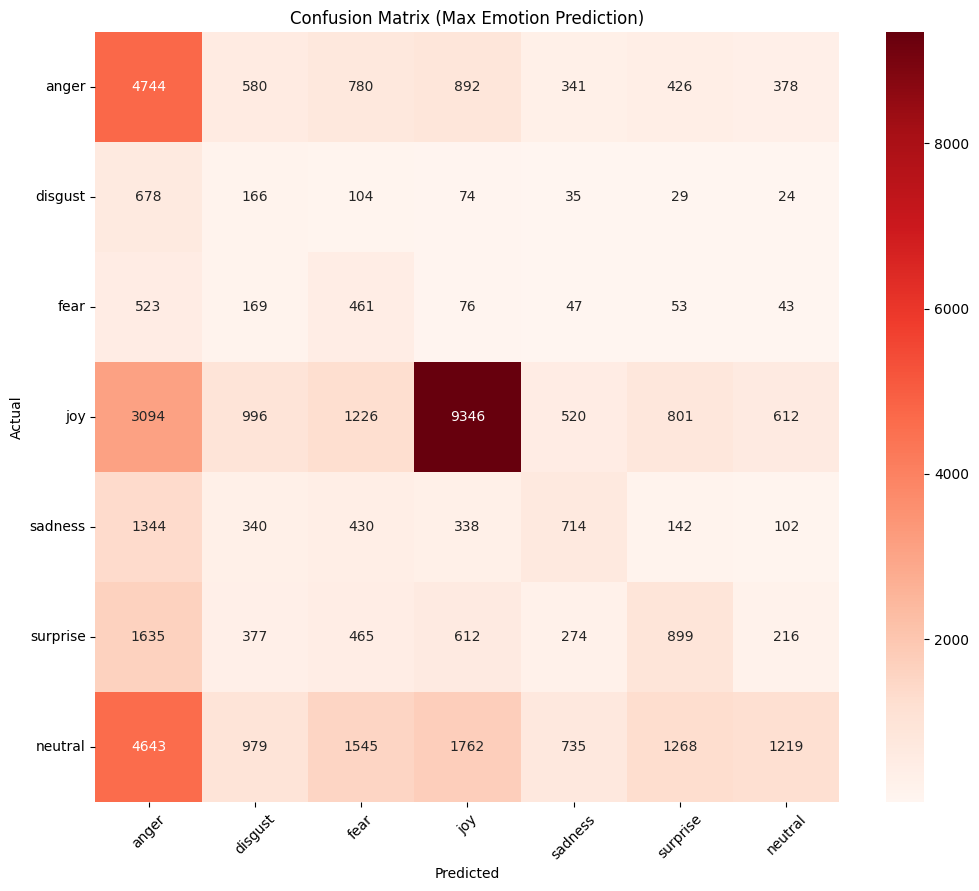

In [60]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Создаем "мультиклассовое" представление (только для визуализации)
y_test_flat = y_test.idxmax(axis=1)
y_pred_flat = pd.DataFrame(y_pred, columns=emotion_columns).idxmax(axis=1)

# Строим матрицу
plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_test_flat, y_pred_flat, labels=emotion_columns)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', 
            xticklabels=emotion_columns, 
            yticklabels=emotion_columns)
plt.title('Confusion Matrix (Max Emotion Prediction)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

In [69]:
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
from sklearn.metrics import hamming_loss, f1_score
import numpy as np

# Гиперпараметры
MAX_LEN = 128
BATCH_SIZE = 32
EPOCHS = 1
LEARNING_RATE = 2e-5

BASE_MODEL = 'sentence-transformers/LaBSE'


from sklearn.model_selection import train_test_split

# 0. Разделение данных
df_train, df_val = train_test_split(
    df,
    test_size=0.2,
    random_state=42
)

# 1. Подготовка данных
class EmotionDataset(Dataset):
    def __init__(self, texts, labels, tokenizer):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=MAX_LEN,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.FloatTensor(label)
        }

# 2. Инициализация модели и токенизатора
tokenizer = BertTokenizer.from_pretrained(BASE_MODEL)
model = BertForSequenceClassification.from_pretrained(
    BASE_MODEL,
    num_labels=len(emotion_columns),
    problem_type="multi_label_classification"
)

# 3. Подготовка DataLoader
def create_data_loader(df, tokenizer, batch_size):
    ds = EmotionDataset(
        texts=df.text.values,
        labels=df[emotion_columns].values.astype(np.float32),
        tokenizer=tokenizer
    )
    return DataLoader(ds, batch_size=batch_size)

train_loader = create_data_loader(df_train, tokenizer, BATCH_SIZE)
val_loader = create_data_loader(df_val, tokenizer, BATCH_SIZE)

# 4. Обучение модели
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
optimizer = AdamW(model.parameters(), lr=LEARNING_RATE)



c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at sentence-transformers/LaBSE and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
c:\Users\rvv19\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no

100%|██████████| 1/1 [5:07:11<00:00, 18431.71s/it]

Epoch 1 completed | Avg Loss: 0.3097


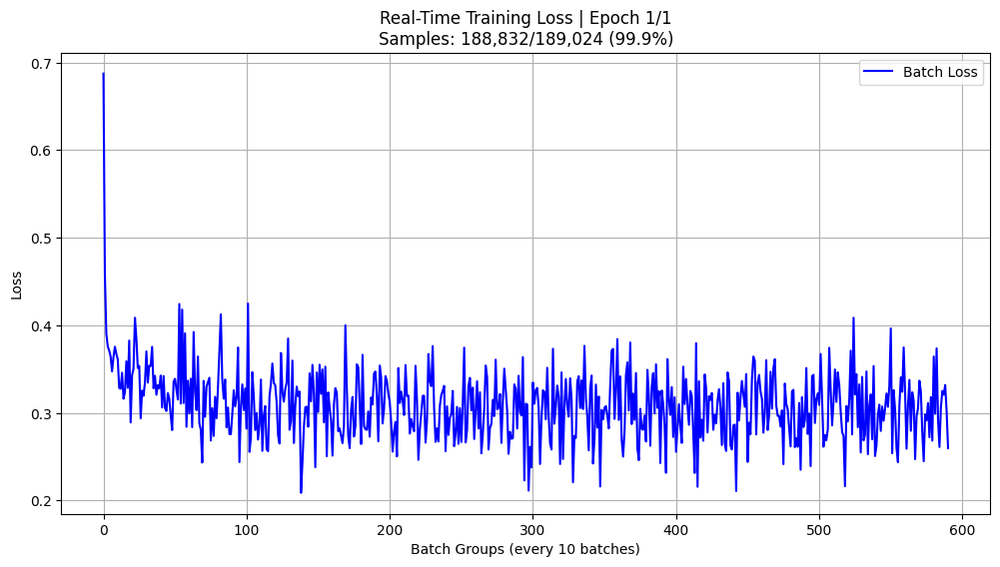

In [70]:
import matplotlib.pyplot as plt
from IPython import display  # Для Jupyter Notebook
from tqdm import tqdm

# Инициализация интерактивного режима
plt.ion()
fig, ax = plt.subplots(figsize=(12, 6))
batch_losses = []
global_step = 0
# Получаем общее количество примеров
total_samples = len(df_train)


# Модифицированный цикл обучения
for epoch in tqdm(range(EPOCHS)):
    model.train()
    epoch_train_loss = 0
    epoch_samples = 0  # Счетчик примеров в эпохе
    
    for batch_num, batch in enumerate(train_loader):
        optimizer.zero_grad()
        
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(
            input_ids=input_ids,
            attention_mask=attention_mask,
            labels=labels
        )

        loss = outputs.loss
        epoch_train_loss += loss.item()
        
        loss.backward()
        optimizer.step()
        
        # Обновление графика каждые 10 батчей
        # Обновление счетчика примеров
        batch_size = input_ids.size(0)
        epoch_samples += batch_size
        if batch_num % 10 == 0:
            batch_losses.append(loss.item())
            
            ax.clear()
            ax.plot(range(len(batch_losses)), batch_losses, 'b-', label='Batch Loss')
            
            # Форматирование заголовка с примером
            title = (
                f"Real-Time Training Loss | Epoch {epoch+1}/{EPOCHS}\n"
                f"Samples: {epoch_samples:,}/{total_samples:,} "
                f"({epoch_samples/total_samples*100:.1f}%)"
            )
            ax.set_title(title)
            
            ax.set_xlabel('Batch Groups (every 10 batches)')
            ax.set_ylabel('Loss')
            ax.grid(True)
            ax.legend()
            
            display.display(fig)  # Для Jupyter
            display.clear_output(wait=True)  # Для Jupyter
            # plt.pause(0.01)  # Для скрипта вне Jupyter
            
        global_step += 1

    # Визуализация после эпохи
    avg_epoch_loss = epoch_train_loss / len(train_loader)
    print(f'Epoch {epoch+1} completed | Avg Loss: {avg_epoch_loss:.4f}')

plt.ioff()
plt.show()

In [59]:
# 5. Оценка модели
def evaluate_model(model, data_loader, device):
    model.eval()
    predictions = []
    true_labels = []

    with torch.no_grad():
        for batch in data_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )

            logits = outputs.logits
            preds = torch.sigmoid(logits) > 0.5
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    return {
        'hamming_loss': hamming_loss(true_labels, predictions),
        'f1_micro': f1_score(true_labels, predictions, average='micro'),
        'f1_macro': f1_score(true_labels, predictions, average='macro'),
        'f1_weigted': f1_score(true_labels, predictions, average='weighted')
    }

metrics = evaluate_model(model, val_loader, device)
print(f"\nValidation Metrics:")
print(f"Hamming Loss: {metrics['hamming_loss']:.4f}")
print(f"Micro F1: {metrics['f1_micro']:.4f}")
print(f"Macro F1: {metrics['f1_macro']:.4f}")
print(f"weigted F1: {metrics['f1_weigted']:.4f}")


Validation Metrics:
Hamming Loss: 0.1288
Micro F1: 0.4697
Macro F1: 0.3492
weigted F1: 0.4423


In [ ]:
#'sergeyzh/rubert-tiny-turbo'
metrics = evaluate_model(model, val_loader, device)
print(f"\nValidation Metrics:")
print(f"Hamming Loss: {metrics['hamming_loss']:.4f}")
print(f"Micro F1: {metrics['f1_micro']:.4f}")
print(f"Macro F1: {metrics['f1_macro']:.4f}")
print(f"weigted F1: {metrics['f1_weigted']:.4f}")


Validation Metrics:
Hamming Loss: 0.1251
Micro F1: 0.5013
Macro F1: 0.3707
weigted F1: 0.4757


In [ ]:
#sentence-transformers/LaBSE - 1 эпоха
#'sergeyzh/rubert-tiny-turbo'
metrics = evaluate_model(model, val_loader, device)
print(f"\nValidation Metrics:")
print(f"Hamming Loss: {metrics['hamming_loss']:.4f}")
print(f"Micro F1: {metrics['f1_micro']:.4f}")
print(f"Macro F1: {metrics['f1_macro']:.4f}")
print(f"weigted F1: {metrics['f1_weigted']:.4f}")


Validation Metrics:
Hamming Loss: 0.1241
Micro F1: 0.4954
Macro F1: 0.3701
weigted F1: 0.4681
